In [27]:
# import os

# os.environ["KERAS_BACKEND"] = "tensorflow"

# Setting random seed to obtain reproducible results.
import tensorflow as tf

tf.random.set_seed(42)

import keras
from keras import layers

import os
import glob
import imageio.v2 as imageio
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

# Initialize global variables.
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 5
NUM_SAMPLES = 32
POS_ENCODE_DIMS = 16
EPOCHS = 100

NUM_SAMPLES_COARSE = 32  # Coarse 단계에서 광선 당 샘플 수 (사용자 요청)
NUM_SAMPLES_FINE_IMPORTANCE = 64 # Fine 단계에서 PDF 샘플링으로 추가할 중요 샘플 수 (사용자 요청)
# 실제 Fine 단계에서 사용될 총 샘플 수는 NUM_SAMPLES_COARSE + NUM_SAMPLES_FINE_IMPORTANCE 가 됩니다.


In [28]:
# Download the data if it does not already exist.
url = (
    "http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz"
)
data = tf.keras.utils.get_file(origin=url)

data = np.load(data)
images = data["images"]
im_shape = images.shape
(num_images, H, W, _) = images.shape
(poses, focal) = (data["poses"], data["focal"])

# Plot a random image from the dataset for visualization.
# plt.imshow(images[np.random.randint(low=0, high=num_images)])
# plt.show()

In [29]:
def sample_pdf(bins, weights, N_samples, det=False):
    weights = weights + 1e-5
    pdf = weights / tf.reduce_sum(weights, axis=-1, keepdims=True)
    cdf = tf.cumsum(pdf, axis=-1)
    cdf = tf.concat([tf.zeros_like(cdf[..., :1]), cdf], axis=-1)

    if det:
        u = tf.linspace(0.0, 1.0, N_samples)
        u_shape = tf.concat([tf.shape(cdf)[:-1], [N_samples]], axis=0)
        u = tf.broadcast_to(u, u_shape)
    else:
        u_shape = tf.concat([tf.shape(cdf)[:-1], [N_samples]], axis=0)
        u = tf.random.uniform(u_shape)

    inds = tf.searchsorted(cdf, u, side='right')

    below = tf.maximum(0, inds - 1)
    above = tf.minimum(tf.shape(cdf)[-1] - 1, inds)
    inds_g = tf.stack([below, above], axis=-1)

    batch_dims_for_gather = cdf.shape.rank - 1
    if batch_dims_for_gather < 0: # rank가 None일 경우 대비
        # 이 경우, 입력 데이터의 일반적인 배치 차원 수를 가정해야 합니다.
        # 예를 들어 (B, H, W, N_points) 형태라면 배치 차원은 3개.
        # 이 값은 컨텍스트에 따라 달라지므로 주의해야 합니다.
        # 보다 안전하게는, 이 함수를 호출하는 부분에서 batch_dims를 명시적으로 계산하여 전달하거나,
        # 또는 입력 텐서의 정적 shape이 보장되도록 해야 합니다.
        # 여기서는 일단 0 이상으로 가정하고 진행합니다. (에러 방지 목적)
        # 실제로는 이 분기에 들어오지 않도록 shape 관리가 필요합니다.
        batch_dims_for_gather = tf.maximum(0, tf.rank(cdf) -1)


    # bins와 cdf의 배치 차원 수가 동일하다고 가정합니다.
    # 만약 bins.shape.rank가 None이면, cdf와 동일한 batch_dims 사용 시도
    if bins.shape.rank is not None and cdf.shape.rank is not None and bins.shape.rank != cdf.shape.rank:
        # 이 경우, gather 연산을 위해 batch_dims를 어떻게 설정할지 더 신중한 고려가 필요.
        # 여기서는 cdf의 batch_dims를 기준으로 함.
        pass


    cdf_g = tf.gather(cdf, inds_g, batch_dims=batch_dims_for_gather)
    bins_g = tf.gather(bins, inds_g, batch_dims=batch_dims_for_gather)

    denom = cdf_g[..., 1] - cdf_g[..., 0]
    denom = tf.where(denom < 1e-5, tf.ones_like(denom), denom)
    t = (u - cdf_g[..., 0]) / denom
    samples = bins_g[..., 0] + t * (bins_g[..., 1] - bins_g[..., 0])
    return samples

In [30]:

def encode_position(x):
    """Encodes the position into its corresponding Fourier feature.

    Args:
        x: The input coordinate.

    Returns:
        Fourier features tensors of the position.
    """
    positions = [x]
    for i in range(POS_ENCODE_DIMS):
        for fn in [tf.sin, tf.cos]:
            positions.append(fn(2.0**i * x))
    return tf.concat(positions, axis=-1)


def get_rays(height, width, focal, pose):
    """Computes origin point and direction vector of rays.

    Args:
        height: Height of the image.
        width: Width of the image.
        focal: The focal length between the images and the camera.
        pose: The pose matrix of the camera.

    Returns:
        Tuple of origin point and direction vector for rays.
    """
    # Build a meshgrid for the rays.
    i, j = tf.meshgrid(
        tf.range(width, dtype=tf.float32),
        tf.range(height, dtype=tf.float32),
        indexing="xy",
    )

    # Normalize the x axis coordinates.
    transformed_i = (i - width * 0.5) / focal

    # Normalize the y axis coordinates.
    transformed_j = (j - height * 0.5) / focal

    # Create the direction unit vectors.
    directions = tf.stack([transformed_i, -transformed_j, -tf.ones_like(i)], axis=-1)

    # Get the camera matrix.
    camera_matrix = pose[:3, :3]
    height_width_focal = pose[:3, -1]

    # Get origins and directions for the rays.
    transformed_dirs = directions[..., None, :]
    camera_dirs = transformed_dirs * camera_matrix
    ray_directions = tf.reduce_sum(camera_dirs, axis=-1)
    ray_origins = tf.broadcast_to(height_width_focal, tf.shape(ray_directions))

    # Return the origins and directions.
    return (ray_origins, ray_directions)

def render_flat_rays_for_coarse(ray_origins, ray_directions, near, far, num_samples, perturb=False):
    if perturb:
        shape_prefix = tf.shape(ray_origins)[:-1]
        bin_starts_flat = tf.linspace(near, far, num_samples + 1)[:-1]
        
        shape_prefix_dims_len = tf.rank(ray_origins) - 1
        view_shape_for_linspace = tf.concat([tf.ones(shape_prefix_dims_len, dtype=tf.int32), [num_samples]], axis=0)
        bin_starts_b = tf.reshape(bin_starts_flat, view_shape_for_linspace)
        
        bin_width = (far - near) / num_samples
        
        rand_shape = tf.concat([shape_prefix, [num_samples]], axis=0)
        random_offsets = tf.random.uniform(shape=rand_shape) * bin_width
        
        t_vals_shaped = bin_starts_b + random_offsets
    else:
        _t_vals_flat = tf.linspace(near, far, num_samples)
        shape_prefix = tf.shape(ray_origins)[:-1]
        t_vals_shaped = tf.broadcast_to(_t_vals_flat, tf.concat([shape_prefix, [num_samples]], axis=0))

    rays = ray_origins[..., None, :] + (
        ray_directions[..., None, :] * t_vals_shaped[..., None]
    )
    
    rays_flat = tf.reshape(rays, [-1, 3])
    rays_flat_encoded = encode_position(rays_flat)
    
    return (rays_flat_encoded, t_vals_shaped)

def map_fn(pose):
    (ray_origins, ray_directions) = get_rays(height=H, width=W, focal=focal, pose=pose)
    return (ray_origins, ray_directions)

# Create the training split.
split_index = int(num_images * 0.8)

# Split the images into training and validation.
train_images = images[:split_index]
val_images = images[split_index:]

# Split the poses into training and validation.
train_poses = poses[:split_index]
val_poses = poses[split_index:]

# Make the training pipeline.
train_img_ds = tf.data.Dataset.from_tensor_slices(train_images)
train_pose_ds = tf.data.Dataset.from_tensor_slices(train_poses)
train_ray_ds = train_pose_ds.map(map_fn, num_parallel_calls=AUTO)
training_ds = tf.data.Dataset.zip((train_img_ds, train_ray_ds))
train_ds = (
    training_ds.shuffle(BATCH_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True, num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

# Make the validation pipeline.
val_img_ds = tf.data.Dataset.from_tensor_slices(val_images)
val_pose_ds = tf.data.Dataset.from_tensor_slices(val_poses)
val_ray_ds = val_pose_ds.map(map_fn, num_parallel_calls=AUTO)
validation_ds = tf.data.Dataset.zip((val_img_ds, val_ray_ds))
val_ds = (
    validation_ds.shuffle(BATCH_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True, num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

In [31]:
# 전역 변수 (첫 번째 셀에서 정의되었다고 가정)
# POS_ENCODE_DIMS, BATCH_SIZE
# NUM_SAMPLES_COARSE, NUM_SAMPLES_FINE_IMPORTANCE
# H, W (데이터 로드 시 결정)

# 단일 인코딩된 좌표의 차원 수
SINGLE_COORD_ENCODED_DIMS = 2 * 3 * POS_ENCODE_DIMS + 3

def get_nerf_model_modified(num_layers, encoded_dims_per_coord):
    inputs = keras.Input(shape=(encoded_dims_per_coord,))
    x = inputs
    for i in range(num_layers):
        x = layers.Dense(units=64, activation="relu")(x)
        if i % 4 == 0 and i > 0:
            x = layers.concatenate([x, inputs], axis=-1)
    outputs = layers.Dense(units=4)(x)
    return keras.Model(inputs=inputs, outputs=outputs)

def render_rays_hierarchical(
    model_coarse,
    model_fine,
    ray_origins,
    ray_directions,
    near,
    far,
    perturb_coarse=True,
    train=True # 이 train 인자를 모델 호출 시 training 인자로 사용
    ):

    current_batch_size = tf.shape(ray_origins)[0]
    h_dim = tf.shape(ray_origins)[1]
    w_dim = tf.shape(ray_origins)[2]

    rays_flat_coarse_encoded, t_vals_coarse = render_flat_rays_for_coarse(
        ray_origins, ray_directions, near, far, NUM_SAMPLES_COARSE, perturb=perturb_coarse
    )

    # 모델 호출 시 .predict() 대신 직접 호출하고 training 인자 전달
    predictions_coarse_flat = model_coarse(rays_flat_coarse_encoded, training=train)

    predictions_coarse = tf.reshape(
        predictions_coarse_flat,
        shape=(current_batch_size, h_dim, w_dim, NUM_SAMPLES_COARSE, 4)
    )

    rgb_coarse_samples = tf.sigmoid(predictions_coarse[..., :-1])
    sigma_a_coarse_samples = tf.nn.relu(predictions_coarse[..., -1])

    delta_coarse = t_vals_coarse[..., 1:] - t_vals_coarse[..., :-1]
    delta_coarse = tf.concat(
        [delta_coarse, tf.broadcast_to([1e10], shape=tf.concat([tf.shape(delta_coarse)[:-1],[1]], axis=0) )], axis=-1
    )

    alpha_coarse = 1.0 - tf.exp(-sigma_a_coarse_samples * delta_coarse)
    epsilon = 1e-10
    transmittance_coarse = tf.math.cumprod(1.0 - alpha_coarse + epsilon, axis=-1, exclusive=True)
    weights_coarse = alpha_coarse * transmittance_coarse

    rgb_coarse = tf.reduce_sum(weights_coarse[..., None] * rgb_coarse_samples, axis=-2)
    depth_coarse = tf.reduce_sum(weights_coarse * t_vals_coarse, axis=-1)
    acc_coarse = tf.reduce_sum(weights_coarse, axis=-1)

    t_vals_mid_coarse = .5 * (t_vals_coarse[..., 1:] + t_vals_coarse[..., :-1])
    weights_for_pdf = weights_coarse[..., :-1]

    t_samples_fine_importance = sample_pdf(
        bins=t_vals_mid_coarse,
        weights=weights_for_pdf,
        N_samples=NUM_SAMPLES_FINE_IMPORTANCE,
        det=not train
    )
    t_samples_fine_importance = tf.stop_gradient(t_samples_fine_importance)

    t_vals_fine_combined = tf.sort(
        tf.concat([t_vals_coarse, t_samples_fine_importance], axis=-1), axis=-1
    )

    rays_fine = ray_origins[..., None, :] + (
        ray_directions[..., None, :] * t_vals_fine_combined[..., None]
    )
    
    rays_fine_flat = tf.reshape(rays_fine, [-1, 3])
    rays_fine_flat_encoded = encode_position(rays_fine_flat)

    # 모델 호출 시 .predict() 대신 직접 호출하고 training 인자 전달
    predictions_fine_flat = model_fine(rays_fine_flat_encoded, training=train)
    
    num_total_fine_samples = NUM_SAMPLES_COARSE + NUM_SAMPLES_FINE_IMPORTANCE
    predictions_fine = tf.reshape(
        predictions_fine_flat,
        shape=(current_batch_size, h_dim, w_dim, num_total_fine_samples, 4)
    )

    rgb_fine_samples = tf.sigmoid(predictions_fine[..., :-1])
    sigma_a_fine_samples = tf.nn.relu(predictions_fine[..., -1])

    delta_fine = t_vals_fine_combined[..., 1:] - t_vals_fine_combined[..., :-1]
    delta_fine = tf.concat(
        [delta_fine, tf.broadcast_to([1e10], shape=tf.concat([tf.shape(delta_fine)[:-1],[1]], axis=0))], axis=-1
    )

    alpha_fine = 1.0 - tf.exp(-sigma_a_fine_samples * delta_fine)
    transmittance_fine = tf.math.cumprod(1.0 - alpha_fine + epsilon, axis=-1, exclusive=True)
    weights_fine = alpha_fine * transmittance_fine

    rgb_fine = tf.reduce_sum(weights_fine[..., None] * rgb_fine_samples, axis=-2)
    depth_fine = tf.reduce_sum(weights_fine * t_vals_fine_combined, axis=-1)
    acc_fine = tf.reduce_sum(weights_fine, axis=-1)
    
    extras = {
        "rgb_coarse": rgb_coarse,
        "depth_coarse": depth_coarse,
        "acc_coarse": acc_coarse,
        "acc_fine": acc_fine,
    }

    return rgb_fine, depth_fine, extras

Epoch 1/100
16/16 [==============================] - ETA: 0s - loss: 0.2833 - coarse_loss: 0.1378 - fine_loss: 0.1100 - coarse_psnr: 8.8124 - psnr: 9.6037

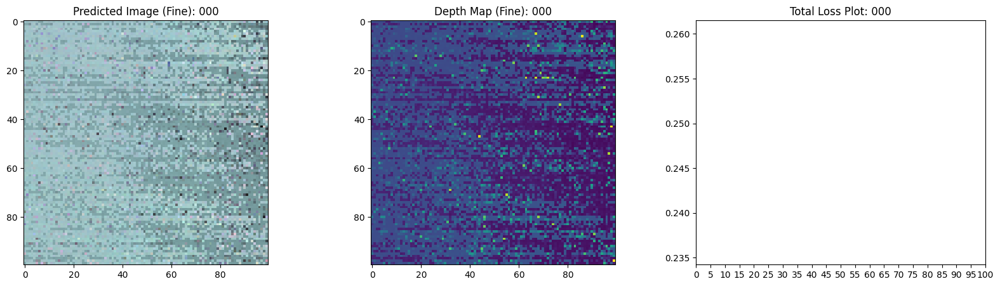

16/16 [==============================] - 11s 557ms/step - loss: 0.2812 - coarse_loss: 0.1378 - fine_loss: 0.1100 - coarse_psnr: 8.8124 - psnr: 9.6073 - val_loss: 0.2018 - val_coarse_loss: 0.1068 - val_fine_loss: 0.0949 - val_coarse_psnr: 9.7752 - val_psnr: 10.2929
Epoch 2/100
16/16 [==============================] - ETA: 0s - loss: 0.1777 - coarse_loss: 0.0903 - fine_loss: 0.0732 - coarse_psnr: 10.5514 - psnr: 11.1349

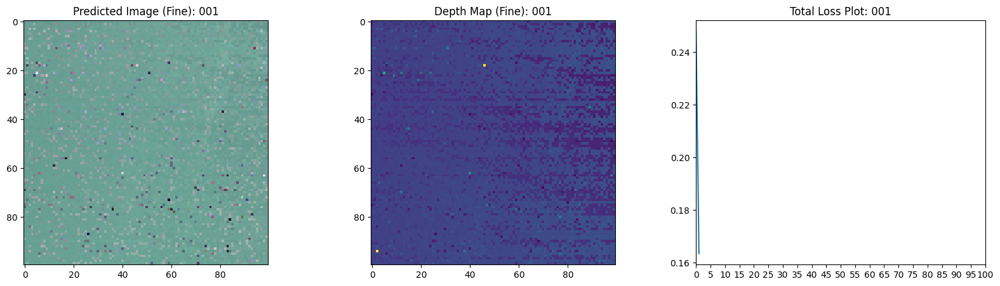

16/16 [==============================] - 8s 502ms/step - loss: 0.1769 - coarse_loss: 0.0903 - fine_loss: 0.0732 - coarse_psnr: 10.5514 - psnr: 11.1626 - val_loss: 0.1437 - val_coarse_loss: 0.0717 - val_fine_loss: 0.0720 - val_coarse_psnr: 11.7105 - val_psnr: 11.9089
Epoch 3/100
16/16 [==============================] - ETA: 0s - loss: 0.1247 - coarse_loss: 0.0633 - fine_loss: 0.0618 - coarse_psnr: 12.4809 - psnr: 12.5409

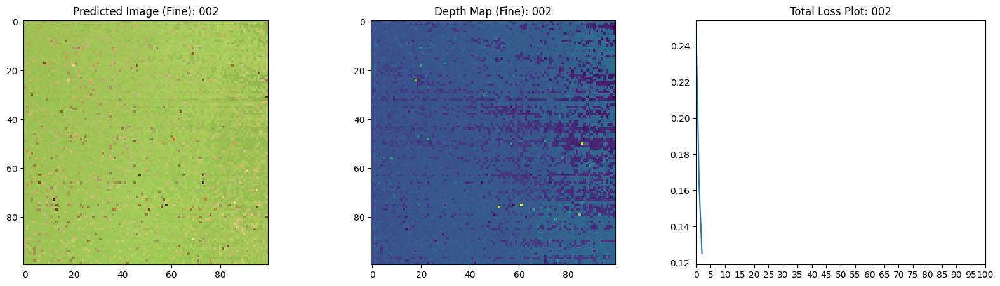

16/16 [==============================] - 8s 504ms/step - loss: 0.1247 - coarse_loss: 0.0633 - fine_loss: 0.0618 - coarse_psnr: 12.4809 - psnr: 12.5438 - val_loss: 0.1396 - val_coarse_loss: 0.0702 - val_fine_loss: 0.0694 - val_coarse_psnr: 11.9873 - val_psnr: 11.9567
Epoch 4/100
16/16 [==============================] - ETA: 0s - loss: 0.1190 - coarse_loss: 0.0614 - fine_loss: 0.0600 - coarse_psnr: 12.4960 - psnr: 12.6591

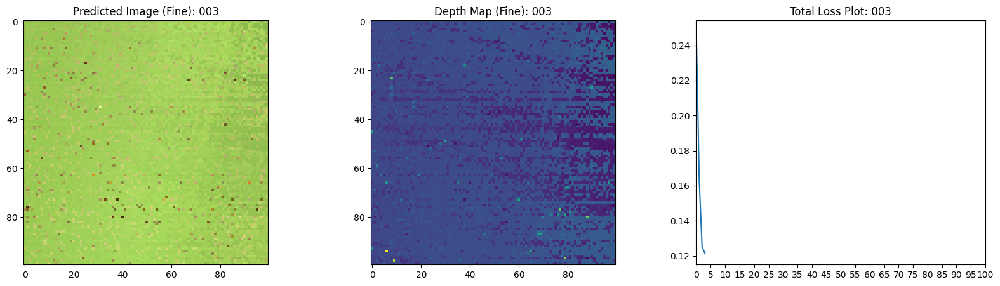

16/16 [==============================] - 8s 503ms/step - loss: 0.1191 - coarse_loss: 0.0614 - fine_loss: 0.0600 - coarse_psnr: 12.4960 - psnr: 12.6559 - val_loss: 0.1344 - val_coarse_loss: 0.0667 - val_fine_loss: 0.0677 - val_coarse_psnr: 12.1010 - val_psnr: 12.1144
Epoch 5/100
16/16 [==============================] - ETA: 0s - loss: 0.1158 - coarse_loss: 0.0604 - fine_loss: 0.0587 - coarse_psnr: 12.6021 - psnr: 12.8382

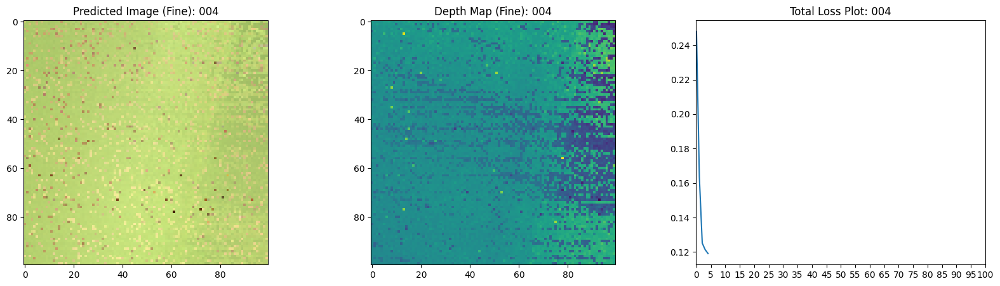

16/16 [==============================] - 8s 506ms/step - loss: 0.1160 - coarse_loss: 0.0604 - fine_loss: 0.0587 - coarse_psnr: 12.6021 - psnr: 12.8336 - val_loss: 0.1341 - val_coarse_loss: 0.0667 - val_fine_loss: 0.0673 - val_coarse_psnr: 12.1276 - val_psnr: 12.1052
Epoch 6/100
16/16 [==============================] - ETA: 0s - loss: 0.1155 - coarse_loss: 0.0600 - fine_loss: 0.0554 - coarse_psnr: 12.6094 - psnr: 12.9139

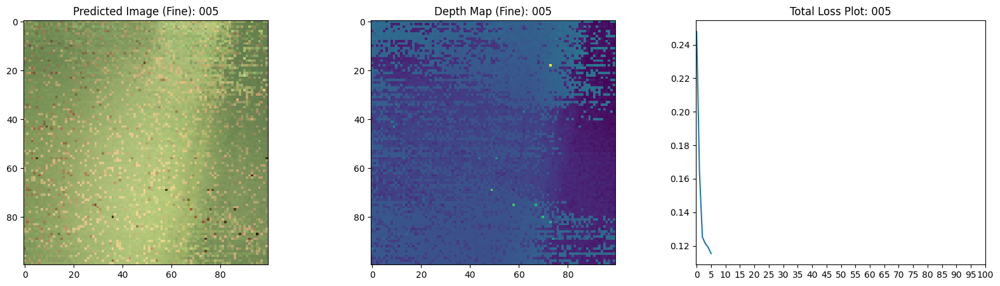

16/16 [==============================] - 8s 507ms/step - loss: 0.1155 - coarse_loss: 0.0600 - fine_loss: 0.0554 - coarse_psnr: 12.6094 - psnr: 12.9189 - val_loss: 0.1289 - val_coarse_loss: 0.0671 - val_fine_loss: 0.0618 - val_coarse_psnr: 12.0752 - val_psnr: 12.4845
Epoch 7/100
16/16 [==============================] - ETA: 0s - loss: 0.1034 - coarse_loss: 0.0576 - fine_loss: 0.0463 - coarse_psnr: 12.8046 - psnr: 13.6560

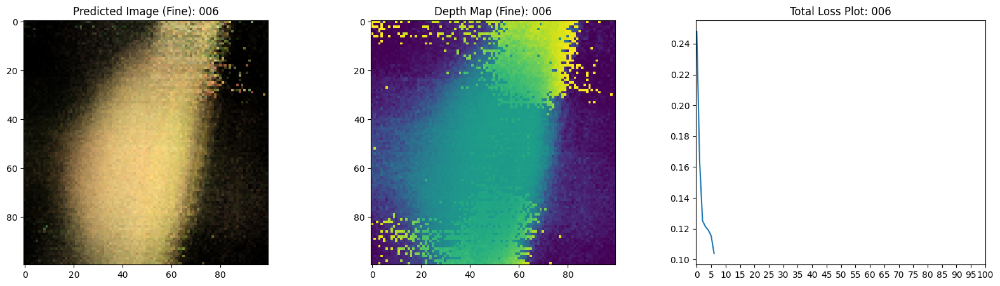

16/16 [==============================] - 8s 502ms/step - loss: 0.1034 - coarse_loss: 0.0576 - fine_loss: 0.0463 - coarse_psnr: 12.8046 - psnr: 13.6641 - val_loss: 0.1098 - val_coarse_loss: 0.0641 - val_fine_loss: 0.0457 - val_coarse_psnr: 12.2171 - val_psnr: 13.6328
Epoch 8/100
16/16 [==============================] - ETA: 0s - loss: 0.0932 - coarse_loss: 0.0565 - fine_loss: 0.0372 - coarse_psnr: 12.9072 - psnr: 14.5375

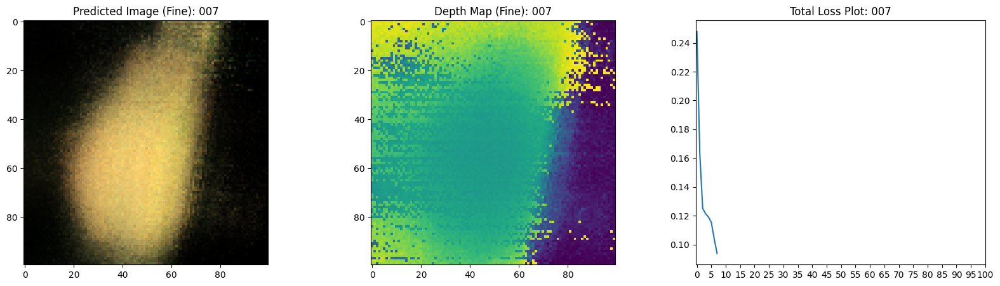

16/16 [==============================] - 8s 508ms/step - loss: 0.0933 - coarse_loss: 0.0565 - fine_loss: 0.0372 - coarse_psnr: 12.9072 - psnr: 14.5450 - val_loss: 0.0946 - val_coarse_loss: 0.0583 - val_fine_loss: 0.0363 - val_coarse_psnr: 12.7160 - val_psnr: 14.5361
Epoch 9/100
16/16 [==============================] - ETA: 0s - loss: 0.0847 - coarse_loss: 0.0531 - fine_loss: 0.0313 - coarse_psnr: 13.1798 - psnr: 15.2023

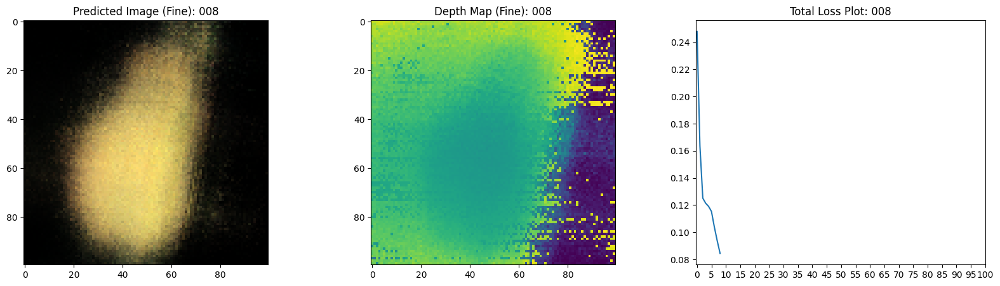

16/16 [==============================] - 8s 505ms/step - loss: 0.0846 - coarse_loss: 0.0531 - fine_loss: 0.0313 - coarse_psnr: 13.1798 - psnr: 15.2096 - val_loss: 0.0895 - val_coarse_loss: 0.0564 - val_fine_loss: 0.0331 - val_coarse_psnr: 12.7489 - val_psnr: 14.8768
Epoch 10/100
16/16 [==============================] - ETA: 0s - loss: 0.0780 - coarse_loss: 0.0470 - fine_loss: 0.0290 - coarse_psnr: 13.7073 - psnr: 15.5246

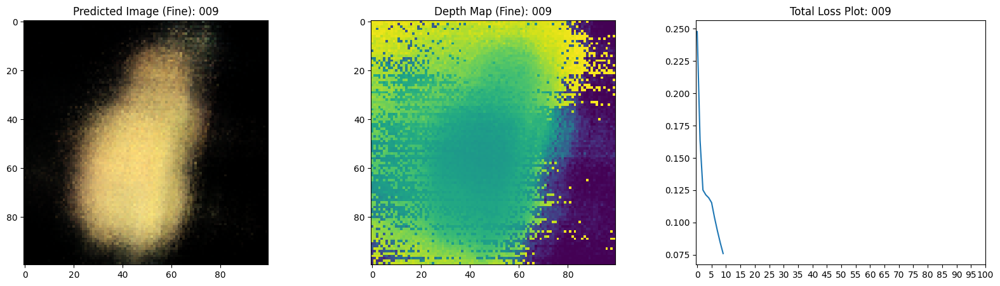

16/16 [==============================] - 8s 504ms/step - loss: 0.0779 - coarse_loss: 0.0470 - fine_loss: 0.0290 - coarse_psnr: 13.7073 - psnr: 15.5310 - val_loss: 0.0740 - val_coarse_loss: 0.0450 - val_fine_loss: 0.0290 - val_coarse_psnr: 13.8424 - val_psnr: 15.5002
Epoch 11/100
16/16 [==============================] - ETA: 0s - loss: 0.0688 - coarse_loss: 0.0394 - fine_loss: 0.0274 - coarse_psnr: 14.4420 - psnr: 15.7679

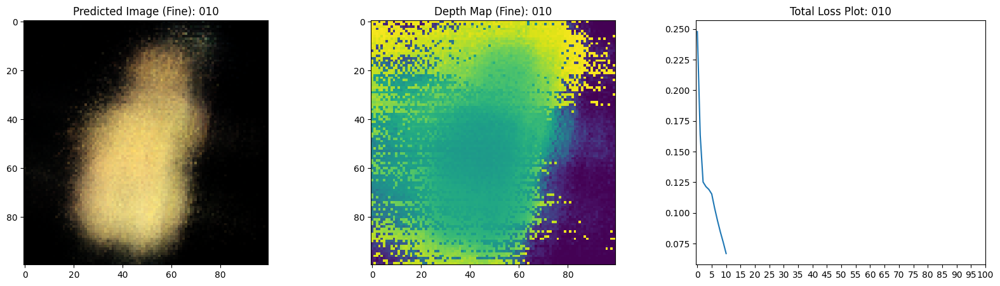

16/16 [==============================] - 8s 509ms/step - loss: 0.0687 - coarse_loss: 0.0394 - fine_loss: 0.0274 - coarse_psnr: 14.4420 - psnr: 15.7728 - val_loss: 0.0639 - val_coarse_loss: 0.0364 - val_fine_loss: 0.0275 - val_coarse_psnr: 14.6545 - val_psnr: 15.7196
Epoch 12/100
16/16 [==============================] - ETA: 0s - loss: 0.0587 - coarse_loss: 0.0317 - fine_loss: 0.0252 - coarse_psnr: 15.3262 - psnr: 16.1220

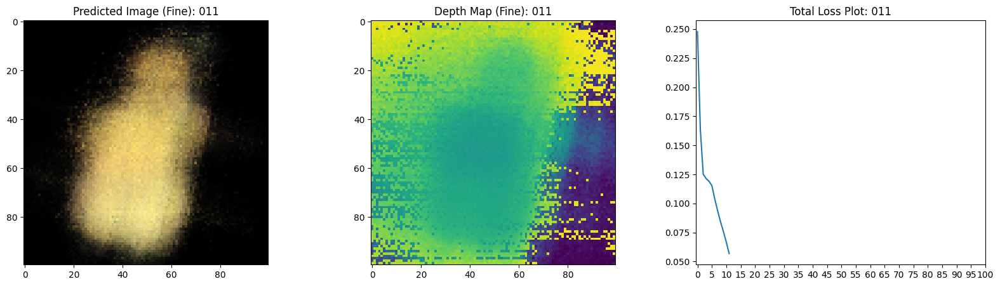

16/16 [==============================] - 8s 505ms/step - loss: 0.0586 - coarse_loss: 0.0317 - fine_loss: 0.0252 - coarse_psnr: 15.3262 - psnr: 16.1282 - val_loss: 0.0547 - val_coarse_loss: 0.0291 - val_fine_loss: 0.0256 - val_coarse_psnr: 15.5824 - val_psnr: 16.0165
Epoch 13/100
16/16 [==============================] - ETA: 0s - loss: 0.0533 - coarse_loss: 0.0278 - fine_loss: 0.0242 - coarse_psnr: 15.8198 - psnr: 16.2397

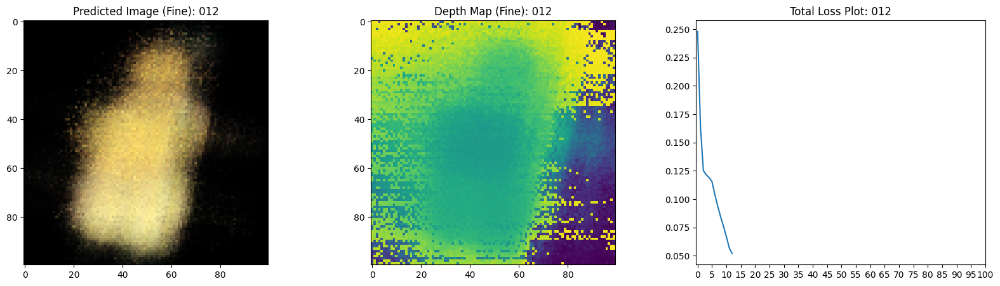

16/16 [==============================] - 8s 505ms/step - loss: 0.0532 - coarse_loss: 0.0278 - fine_loss: 0.0242 - coarse_psnr: 15.8198 - psnr: 16.2479 - val_loss: 0.0516 - val_coarse_loss: 0.0273 - val_fine_loss: 0.0243 - val_coarse_psnr: 15.7385 - val_psnr: 16.2271
Epoch 14/100
16/16 [==============================] - ETA: 0s - loss: 0.0516 - coarse_loss: 0.0264 - fine_loss: 0.0237 - coarse_psnr: 16.0213 - psnr: 16.2953

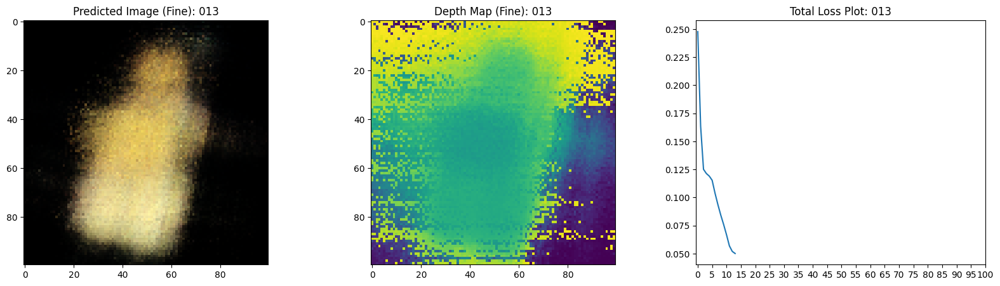

16/16 [==============================] - 8s 503ms/step - loss: 0.0515 - coarse_loss: 0.0264 - fine_loss: 0.0237 - coarse_psnr: 16.0213 - psnr: 16.3052 - val_loss: 0.0492 - val_coarse_loss: 0.0262 - val_fine_loss: 0.0230 - val_coarse_psnr: 15.9109 - val_psnr: 16.4970
Epoch 15/100
16/16 [==============================] - ETA: 0s - loss: 0.0468 - coarse_loss: 0.0240 - fine_loss: 0.0218 - coarse_psnr: 16.4218 - psnr: 16.7296

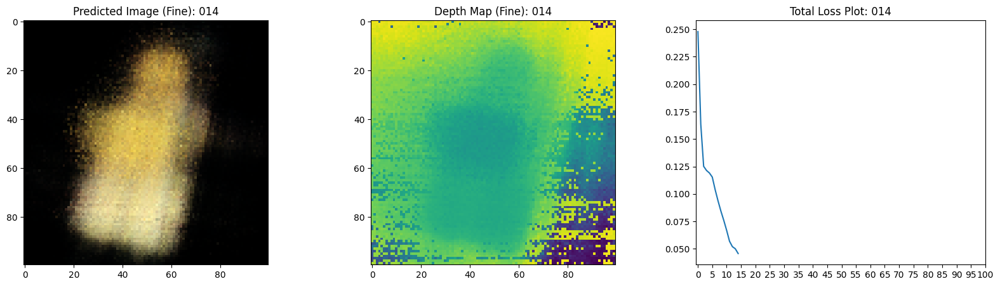

16/16 [==============================] - 8s 508ms/step - loss: 0.0467 - coarse_loss: 0.0240 - fine_loss: 0.0218 - coarse_psnr: 16.4218 - psnr: 16.7350 - val_loss: 0.0448 - val_coarse_loss: 0.0235 - val_fine_loss: 0.0213 - val_coarse_psnr: 16.3661 - val_psnr: 16.7745
Epoch 16/100
16/16 [==============================] - ETA: 0s - loss: 0.0438 - coarse_loss: 0.0230 - fine_loss: 0.0205 - coarse_psnr: 16.5907 - psnr: 16.9927

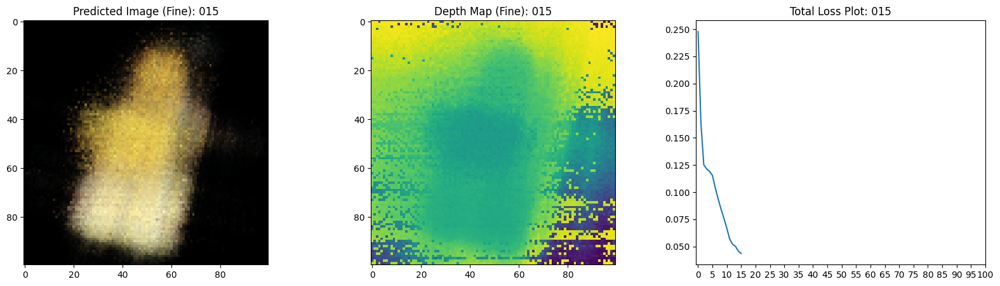

16/16 [==============================] - 8s 535ms/step - loss: 0.0437 - coarse_loss: 0.0230 - fine_loss: 0.0205 - coarse_psnr: 16.5907 - psnr: 16.9977 - val_loss: 0.0418 - val_coarse_loss: 0.0218 - val_fine_loss: 0.0199 - val_coarse_psnr: 16.7243 - val_psnr: 17.0857
Epoch 17/100
16/16 [==============================] - ETA: 0s - loss: 0.0427 - coarse_loss: 0.0222 - fine_loss: 0.0201 - coarse_psnr: 16.7086 - psnr: 17.0927

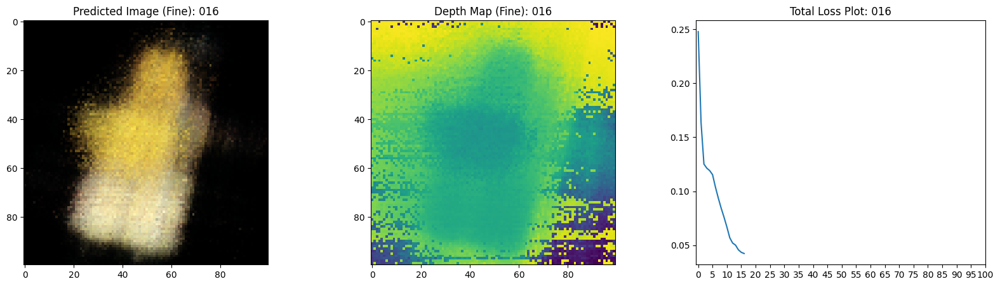

16/16 [==============================] - 8s 505ms/step - loss: 0.0427 - coarse_loss: 0.0222 - fine_loss: 0.0201 - coarse_psnr: 16.7086 - psnr: 17.0946 - val_loss: 0.0400 - val_coarse_loss: 0.0206 - val_fine_loss: 0.0194 - val_coarse_psnr: 16.9855 - val_psnr: 17.1808
Epoch 18/100
16/16 [==============================] - ETA: 0s - loss: 0.0403 - coarse_loss: 0.0204 - fine_loss: 0.0192 - coarse_psnr: 17.0778 - psnr: 17.2115

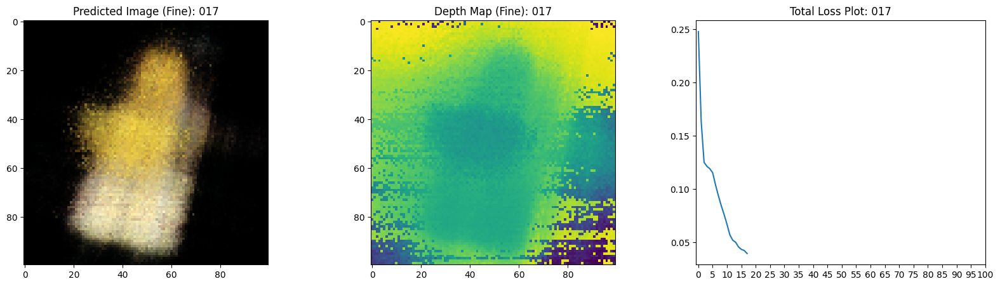

16/16 [==============================] - 8s 504ms/step - loss: 0.0402 - coarse_loss: 0.0204 - fine_loss: 0.0192 - coarse_psnr: 17.0778 - psnr: 17.2189 - val_loss: 0.0383 - val_coarse_loss: 0.0199 - val_fine_loss: 0.0184 - val_coarse_psnr: 17.0848 - val_psnr: 17.4251
Epoch 19/100
16/16 [==============================] - ETA: 0s - loss: 0.0371 - coarse_loss: 0.0193 - fine_loss: 0.0182 - coarse_psnr: 17.3028 - psnr: 17.5826

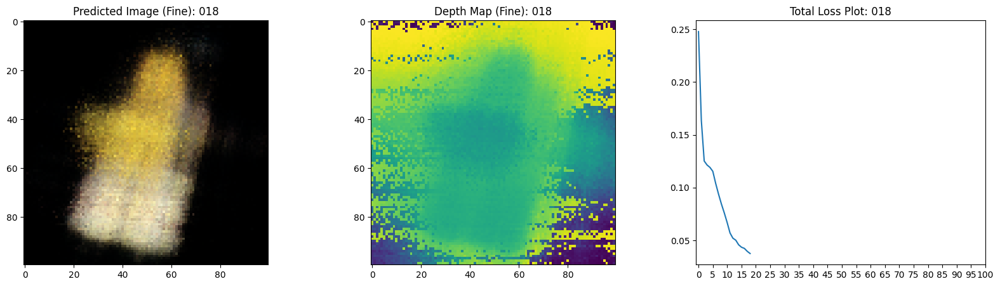

16/16 [==============================] - 8s 504ms/step - loss: 0.0371 - coarse_loss: 0.0193 - fine_loss: 0.0182 - coarse_psnr: 17.3028 - psnr: 17.5814 - val_loss: 0.0367 - val_coarse_loss: 0.0186 - val_fine_loss: 0.0181 - val_coarse_psnr: 17.3475 - val_psnr: 17.5186
Epoch 20/100
16/16 [==============================] - ETA: 0s - loss: 0.0355 - coarse_loss: 0.0182 - fine_loss: 0.0174 - coarse_psnr: 17.5551 - psnr: 17.7935

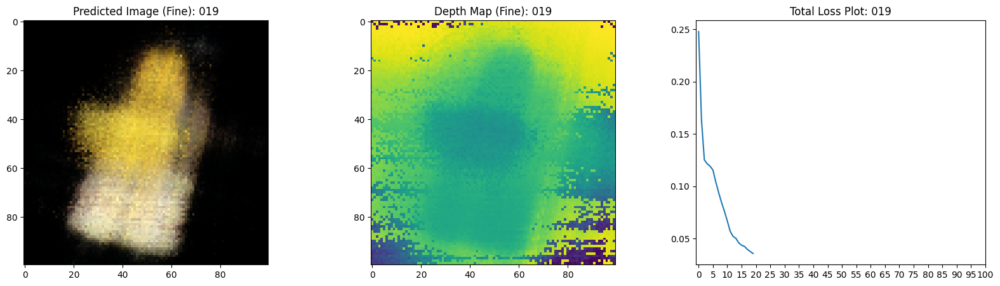

16/16 [==============================] - 8s 505ms/step - loss: 0.0355 - coarse_loss: 0.0182 - fine_loss: 0.0174 - coarse_psnr: 17.5551 - psnr: 17.7911 - val_loss: 0.0349 - val_coarse_loss: 0.0178 - val_fine_loss: 0.0172 - val_coarse_psnr: 17.5613 - val_psnr: 17.6987
Epoch 21/100
16/16 [==============================] - ETA: 0s - loss: 0.0350 - coarse_loss: 0.0176 - fine_loss: 0.0174 - coarse_psnr: 17.6956 - psnr: 17.7287

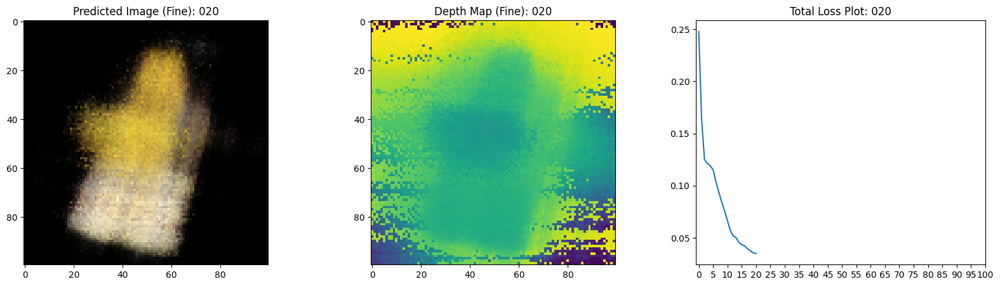

16/16 [==============================] - 8s 505ms/step - loss: 0.0350 - coarse_loss: 0.0176 - fine_loss: 0.0174 - coarse_psnr: 17.6956 - psnr: 17.7299 - val_loss: 0.0334 - val_coarse_loss: 0.0166 - val_fine_loss: 0.0168 - val_coarse_psnr: 17.8874 - val_psnr: 17.8244
Epoch 22/100
16/16 [==============================] - ETA: 0s - loss: 0.0332 - coarse_loss: 0.0166 - fine_loss: 0.0164 - coarse_psnr: 17.9528 - psnr: 17.9702

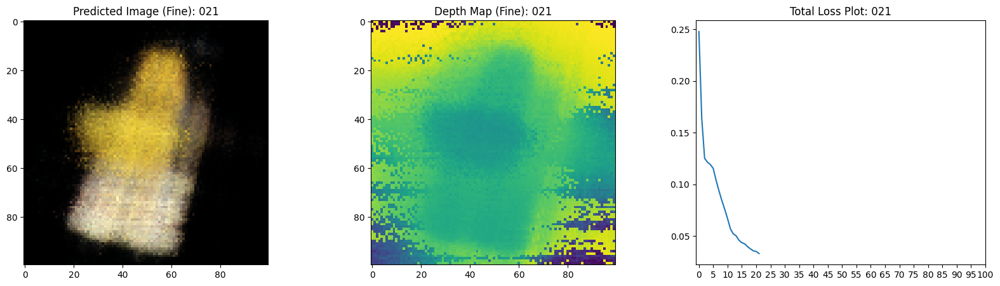

16/16 [==============================] - 8s 504ms/step - loss: 0.0332 - coarse_loss: 0.0166 - fine_loss: 0.0164 - coarse_psnr: 17.9528 - psnr: 17.9726 - val_loss: 0.0325 - val_coarse_loss: 0.0162 - val_fine_loss: 0.0163 - val_coarse_psnr: 17.9818 - val_psnr: 17.9443
Epoch 23/100
16/16 [==============================] - ETA: 0s - loss: 0.0319 - coarse_loss: 0.0162 - fine_loss: 0.0159 - coarse_psnr: 18.0748 - psnr: 18.1524

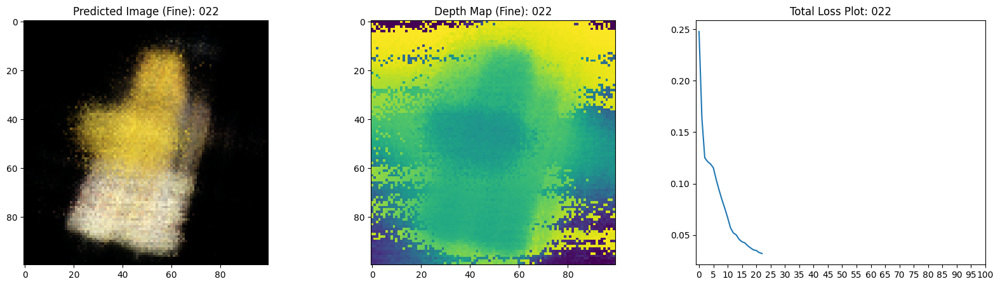

16/16 [==============================] - 8s 503ms/step - loss: 0.0319 - coarse_loss: 0.0162 - fine_loss: 0.0159 - coarse_psnr: 18.0748 - psnr: 18.1516 - val_loss: 0.0310 - val_coarse_loss: 0.0152 - val_fine_loss: 0.0158 - val_coarse_psnr: 18.2764 - val_psnr: 18.0588
Epoch 24/100
16/16 [==============================] - ETA: 0s - loss: 0.0314 - coarse_loss: 0.0156 - fine_loss: 0.0157 - coarse_psnr: 18.2259 - psnr: 18.1418

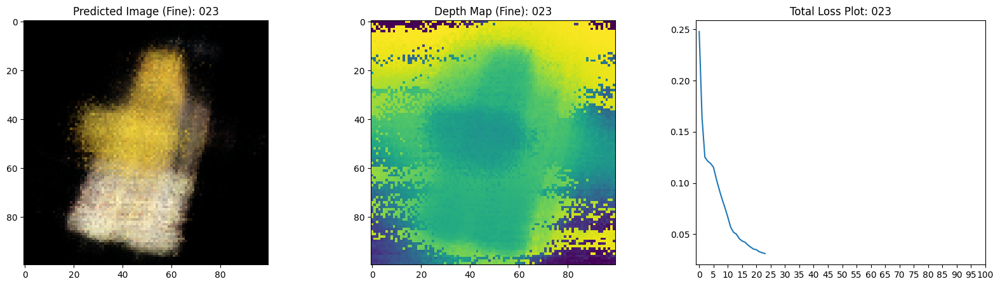

16/16 [==============================] - 8s 503ms/step - loss: 0.0314 - coarse_loss: 0.0156 - fine_loss: 0.0157 - coarse_psnr: 18.2259 - psnr: 18.1437 - val_loss: 0.0304 - val_coarse_loss: 0.0152 - val_fine_loss: 0.0152 - val_coarse_psnr: 18.2517 - val_psnr: 18.2364
Epoch 25/100
16/16 [==============================] - ETA: 0s - loss: 0.0304 - coarse_loss: 0.0150 - fine_loss: 0.0151 - coarse_psnr: 18.3855 - psnr: 18.2830

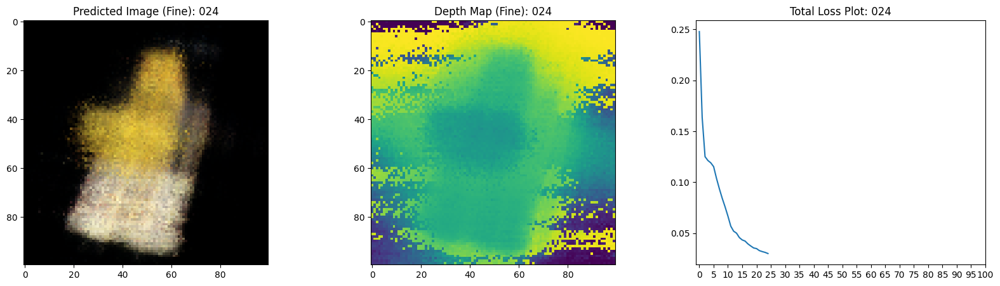

16/16 [==============================] - 8s 503ms/step - loss: 0.0304 - coarse_loss: 0.0150 - fine_loss: 0.0151 - coarse_psnr: 18.3855 - psnr: 18.2864 - val_loss: 0.0299 - val_coarse_loss: 0.0146 - val_fine_loss: 0.0153 - val_coarse_psnr: 18.4702 - val_psnr: 18.2314
Epoch 26/100
16/16 [==============================] - ETA: 0s - loss: 0.0290 - coarse_loss: 0.0145 - fine_loss: 0.0147 - coarse_psnr: 18.5354 - psnr: 18.4934

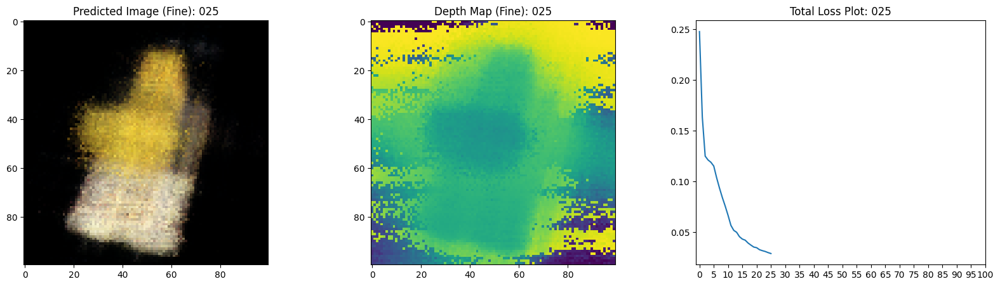

16/16 [==============================] - 8s 504ms/step - loss: 0.0290 - coarse_loss: 0.0145 - fine_loss: 0.0147 - coarse_psnr: 18.5354 - psnr: 18.4916 - val_loss: 0.0290 - val_coarse_loss: 0.0141 - val_fine_loss: 0.0149 - val_coarse_psnr: 18.6071 - val_psnr: 18.3422
Epoch 27/100
16/16 [==============================] - ETA: 0s - loss: 0.0287 - coarse_loss: 0.0142 - fine_loss: 0.0145 - coarse_psnr: 18.6291 - psnr: 18.5161

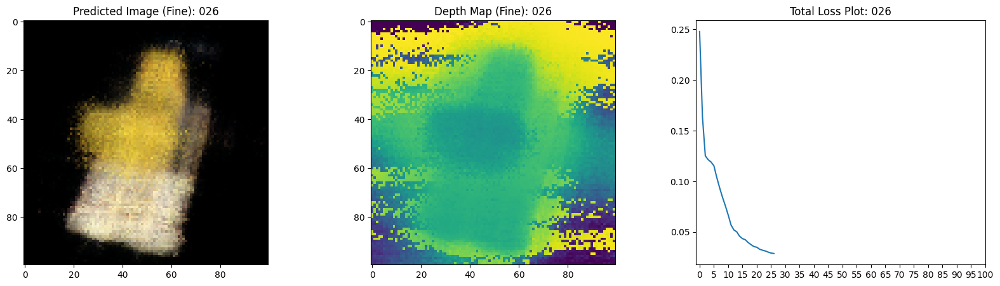

16/16 [==============================] - 8s 505ms/step - loss: 0.0287 - coarse_loss: 0.0142 - fine_loss: 0.0145 - coarse_psnr: 18.6291 - psnr: 18.5173 - val_loss: 0.0282 - val_coarse_loss: 0.0140 - val_fine_loss: 0.0142 - val_coarse_psnr: 18.6101 - val_psnr: 18.5318
Epoch 28/100
16/16 [==============================] - ETA: 0s - loss: 0.0279 - coarse_loss: 0.0138 - fine_loss: 0.0142 - coarse_psnr: 18.7771 - psnr: 18.6220

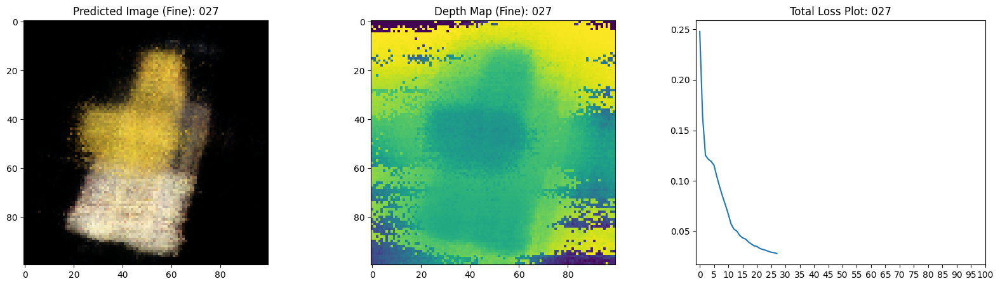

16/16 [==============================] - 8s 506ms/step - loss: 0.0279 - coarse_loss: 0.0138 - fine_loss: 0.0142 - coarse_psnr: 18.7771 - psnr: 18.6221 - val_loss: 0.0276 - val_coarse_loss: 0.0133 - val_fine_loss: 0.0143 - val_coarse_psnr: 18.8572 - val_psnr: 18.5162
Epoch 29/100
16/16 [==============================] - ETA: 0s - loss: 0.0271 - coarse_loss: 0.0133 - fine_loss: 0.0137 - coarse_psnr: 18.9030 - psnr: 18.7444

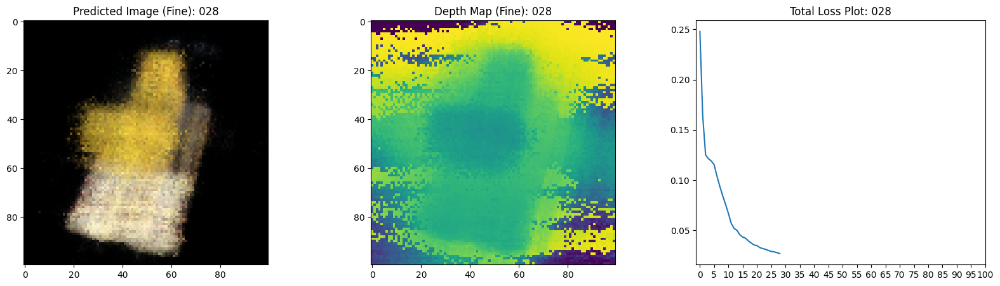

16/16 [==============================] - 8s 505ms/step - loss: 0.0271 - coarse_loss: 0.0133 - fine_loss: 0.0137 - coarse_psnr: 18.9030 - psnr: 18.7456 - val_loss: 0.0261 - val_coarse_loss: 0.0126 - val_fine_loss: 0.0135 - val_coarse_psnr: 19.1123 - val_psnr: 18.7598
Epoch 30/100
16/16 [==============================] - ETA: 0s - loss: 0.0266 - coarse_loss: 0.0132 - fine_loss: 0.0136 - coarse_psnr: 18.9555 - psnr: 18.8622

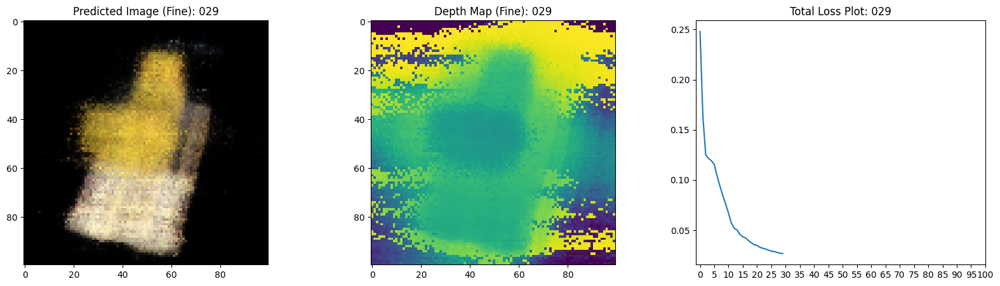

16/16 [==============================] - 8s 505ms/step - loss: 0.0266 - coarse_loss: 0.0132 - fine_loss: 0.0136 - coarse_psnr: 18.9555 - psnr: 18.8597 - val_loss: 0.0262 - val_coarse_loss: 0.0127 - val_fine_loss: 0.0136 - val_coarse_psnr: 19.0859 - val_psnr: 18.7579
Epoch 31/100
16/16 [==============================] - ETA: 0s - loss: 0.0258 - coarse_loss: 0.0130 - fine_loss: 0.0133 - coarse_psnr: 19.0280 - psnr: 18.9537

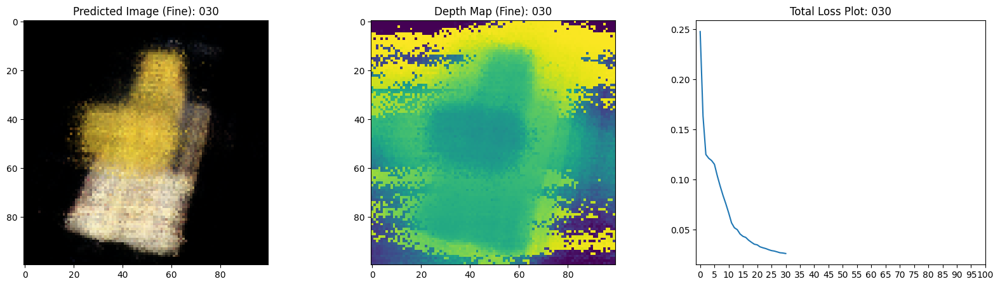

16/16 [==============================] - 8s 506ms/step - loss: 0.0259 - coarse_loss: 0.0130 - fine_loss: 0.0133 - coarse_psnr: 19.0280 - psnr: 18.9500 - val_loss: 0.0254 - val_coarse_loss: 0.0123 - val_fine_loss: 0.0131 - val_coarse_psnr: 19.2007 - val_psnr: 18.8861
Epoch 32/100
16/16 [==============================] - ETA: 0s - loss: 0.0255 - coarse_loss: 0.0127 - fine_loss: 0.0131 - coarse_psnr: 19.1284 - psnr: 18.9950

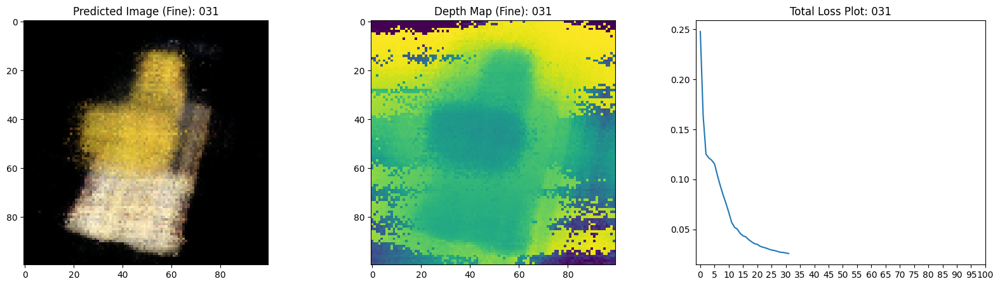

16/16 [==============================] - 8s 537ms/step - loss: 0.0255 - coarse_loss: 0.0127 - fine_loss: 0.0131 - coarse_psnr: 19.1284 - psnr: 18.9942 - val_loss: 0.0247 - val_coarse_loss: 0.0119 - val_fine_loss: 0.0128 - val_coarse_psnr: 19.3491 - val_psnr: 19.0039
Epoch 33/100
16/16 [==============================] - ETA: 0s - loss: 0.0251 - coarse_loss: 0.0122 - fine_loss: 0.0126 - coarse_psnr: 19.2896 - psnr: 19.1067

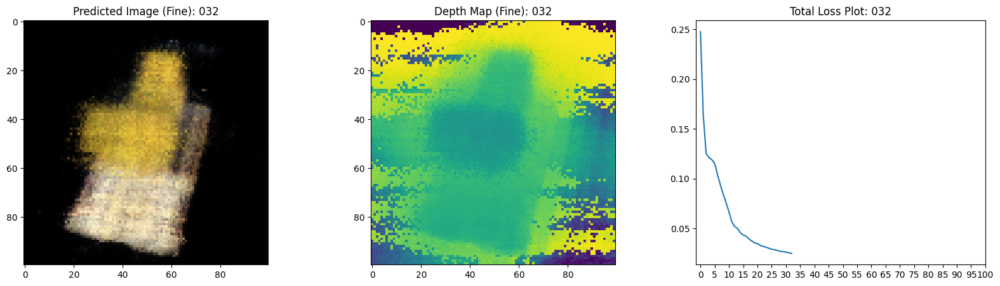

16/16 [==============================] - 8s 504ms/step - loss: 0.0251 - coarse_loss: 0.0122 - fine_loss: 0.0126 - coarse_psnr: 19.2896 - psnr: 19.1081 - val_loss: 0.0249 - val_coarse_loss: 0.0119 - val_fine_loss: 0.0130 - val_coarse_psnr: 19.3745 - val_psnr: 18.9795
Epoch 34/100
16/16 [==============================] - ETA: 0s - loss: 0.0242 - coarse_loss: 0.0122 - fine_loss: 0.0127 - coarse_psnr: 19.3236 - psnr: 19.2545

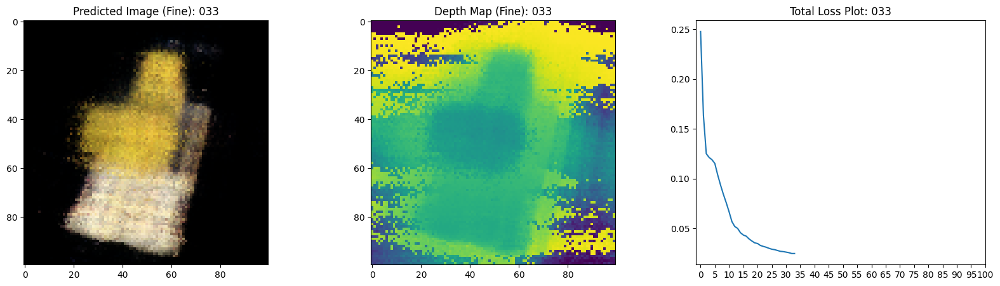

16/16 [==============================] - 8s 504ms/step - loss: 0.0243 - coarse_loss: 0.0122 - fine_loss: 0.0127 - coarse_psnr: 19.3236 - psnr: 19.2478 - val_loss: 0.0243 - val_coarse_loss: 0.0118 - val_fine_loss: 0.0125 - val_coarse_psnr: 19.3896 - val_psnr: 19.1126
Epoch 35/100
16/16 [==============================] - ETA: 0s - loss: 0.0242 - coarse_loss: 0.0119 - fine_loss: 0.0124 - coarse_psnr: 19.3900 - psnr: 19.2194

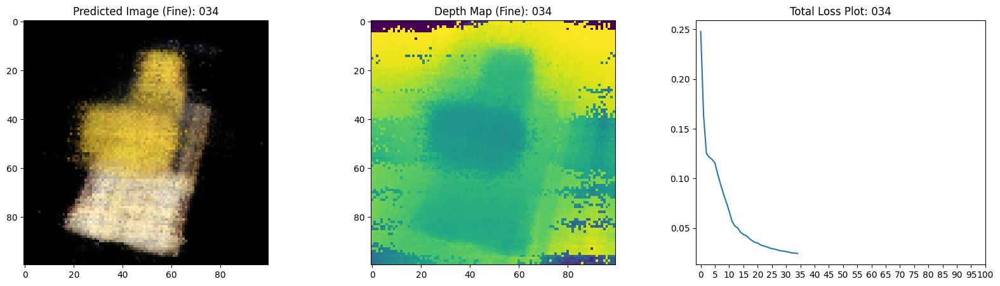

16/16 [==============================] - 8s 504ms/step - loss: 0.0242 - coarse_loss: 0.0119 - fine_loss: 0.0124 - coarse_psnr: 19.3900 - psnr: 19.2192 - val_loss: 0.0239 - val_coarse_loss: 0.0117 - val_fine_loss: 0.0122 - val_coarse_psnr: 19.3903 - val_psnr: 19.1942
Epoch 36/100
16/16 [==============================] - ETA: 0s - loss: 0.0241 - coarse_loss: 0.0118 - fine_loss: 0.0124 - coarse_psnr: 19.4512 - psnr: 19.2613

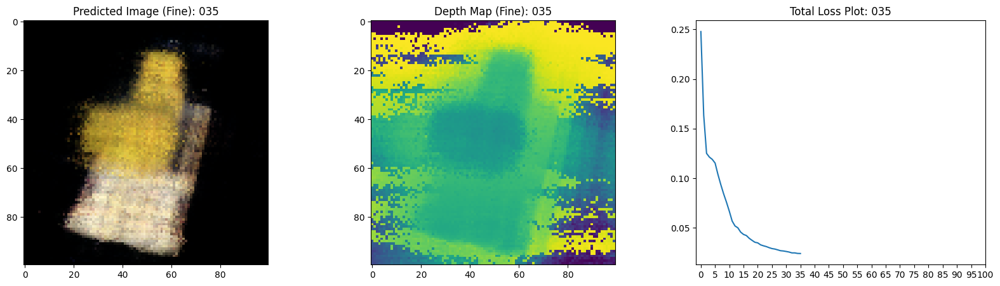

16/16 [==============================] - 8s 504ms/step - loss: 0.0241 - coarse_loss: 0.0118 - fine_loss: 0.0124 - coarse_psnr: 19.4512 - psnr: 19.2590 - val_loss: 0.0236 - val_coarse_loss: 0.0112 - val_fine_loss: 0.0123 - val_coarse_psnr: 19.6152 - val_psnr: 19.2264
Epoch 37/100
16/16 [==============================] - ETA: 0s - loss: 0.0237 - coarse_loss: 0.0115 - fine_loss: 0.0121 - coarse_psnr: 19.5446 - psnr: 19.3155

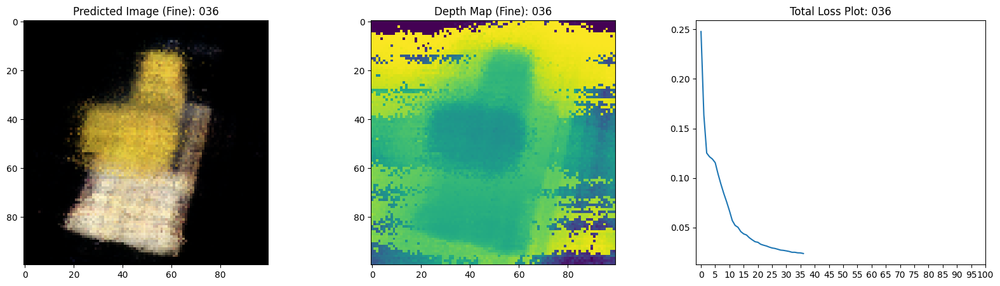

16/16 [==============================] - 8s 505ms/step - loss: 0.0237 - coarse_loss: 0.0115 - fine_loss: 0.0121 - coarse_psnr: 19.5446 - psnr: 19.3159 - val_loss: 0.0231 - val_coarse_loss: 0.0112 - val_fine_loss: 0.0119 - val_coarse_psnr: 19.6379 - val_psnr: 19.3213
Epoch 38/100
16/16 [==============================] - ETA: 0s - loss: 0.0232 - coarse_loss: 0.0112 - fine_loss: 0.0117 - coarse_psnr: 19.6875 - psnr: 19.3969

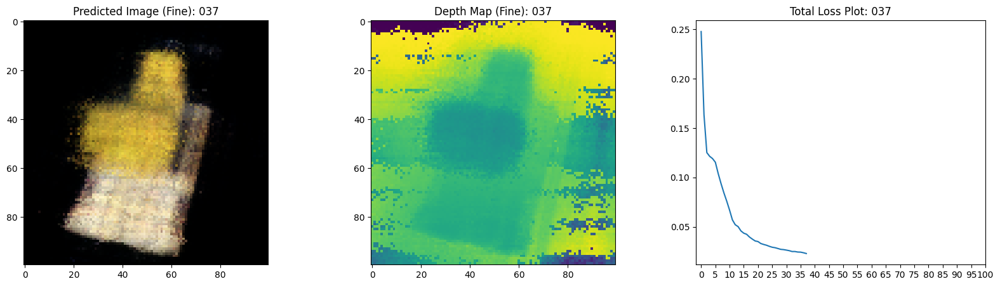

16/16 [==============================] - 8s 503ms/step - loss: 0.0232 - coarse_loss: 0.0112 - fine_loss: 0.0117 - coarse_psnr: 19.6875 - psnr: 19.4021 - val_loss: 0.0227 - val_coarse_loss: 0.0109 - val_fine_loss: 0.0118 - val_coarse_psnr: 19.7477 - val_psnr: 19.3664
Epoch 39/100
16/16 [==============================] - ETA: 0s - loss: 0.0231 - coarse_loss: 0.0111 - fine_loss: 0.0117 - coarse_psnr: 19.7135 - psnr: 19.4208

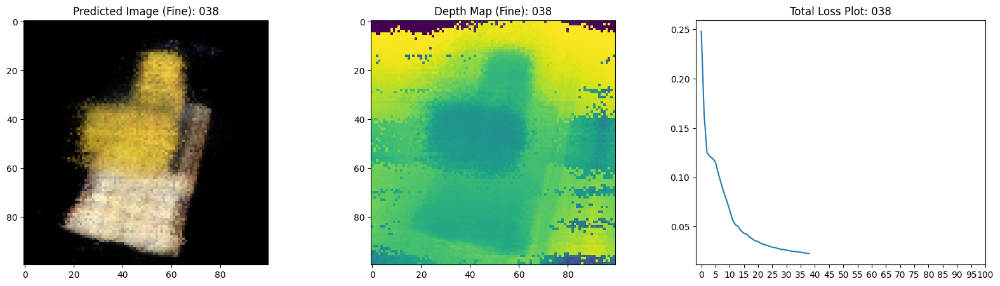

16/16 [==============================] - 8s 502ms/step - loss: 0.0230 - coarse_loss: 0.0111 - fine_loss: 0.0117 - coarse_psnr: 19.7135 - psnr: 19.4249 - val_loss: 0.0224 - val_coarse_loss: 0.0108 - val_fine_loss: 0.0116 - val_coarse_psnr: 19.7845 - val_psnr: 19.4505
Epoch 40/100
16/16 [==============================] - ETA: 0s - loss: 0.0225 - coarse_loss: 0.0110 - fine_loss: 0.0115 - coarse_psnr: 19.7498 - psnr: 19.5576

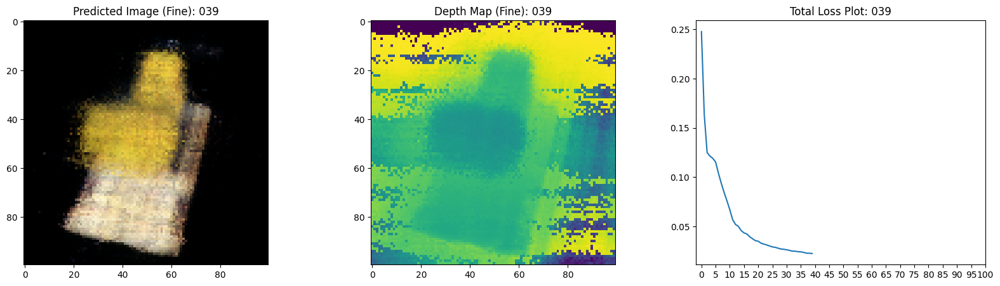

16/16 [==============================] - 8s 503ms/step - loss: 0.0225 - coarse_loss: 0.0110 - fine_loss: 0.0115 - coarse_psnr: 19.7498 - psnr: 19.5571 - val_loss: 0.0223 - val_coarse_loss: 0.0108 - val_fine_loss: 0.0115 - val_coarse_psnr: 19.7668 - val_psnr: 19.5121
Epoch 41/100
16/16 [==============================] - ETA: 0s - loss: 0.0225 - coarse_loss: 0.0111 - fine_loss: 0.0117 - coarse_psnr: 19.6828 - psnr: 19.5216

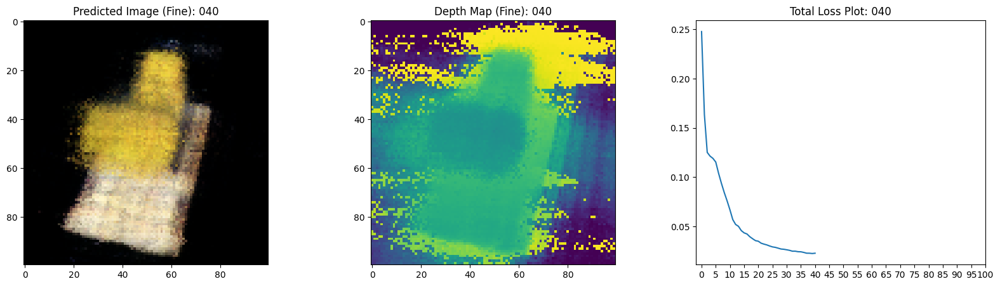

16/16 [==============================] - 8s 505ms/step - loss: 0.0226 - coarse_loss: 0.0111 - fine_loss: 0.0117 - coarse_psnr: 19.6828 - psnr: 19.5191 - val_loss: 0.0231 - val_coarse_loss: 0.0112 - val_fine_loss: 0.0119 - val_coarse_psnr: 19.5963 - val_psnr: 19.3017
Epoch 42/100
16/16 [==============================] - ETA: 0s - loss: 0.0229 - coarse_loss: 0.0110 - fine_loss: 0.0115 - coarse_psnr: 19.7308 - psnr: 19.4450

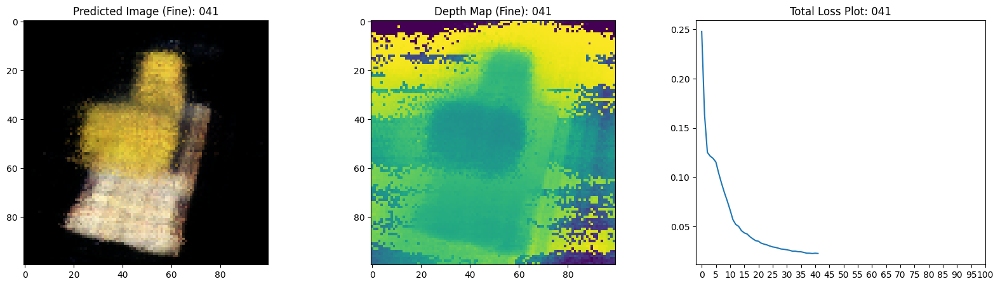

16/16 [==============================] - 8s 502ms/step - loss: 0.0229 - coarse_loss: 0.0110 - fine_loss: 0.0115 - coarse_psnr: 19.7308 - psnr: 19.4508 - val_loss: 0.0219 - val_coarse_loss: 0.0106 - val_fine_loss: 0.0113 - val_coarse_psnr: 19.8358 - val_psnr: 19.5714
Epoch 43/100
16/16 [==============================] - ETA: 0s - loss: 0.0214 - coarse_loss: 0.0105 - fine_loss: 0.0110 - coarse_psnr: 19.9405 - psnr: 19.7995

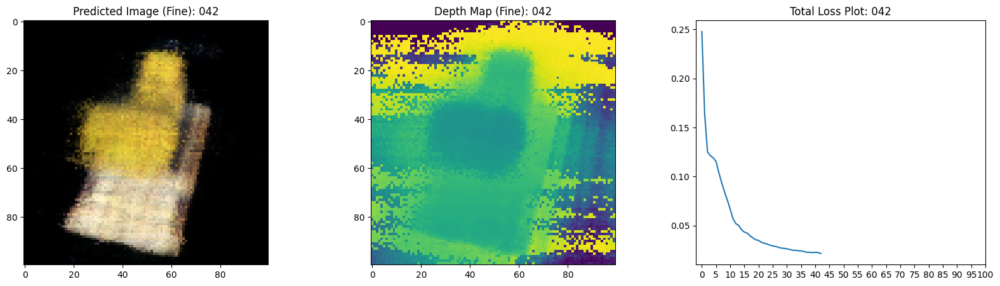

16/16 [==============================] - 8s 504ms/step - loss: 0.0214 - coarse_loss: 0.0105 - fine_loss: 0.0110 - coarse_psnr: 19.9405 - psnr: 19.7963 - val_loss: 0.0202 - val_coarse_loss: 0.0097 - val_fine_loss: 0.0104 - val_coarse_psnr: 20.2366 - val_psnr: 19.9024
Epoch 44/100
16/16 [==============================] - ETA: 0s - loss: 0.0212 - coarse_loss: 0.0104 - fine_loss: 0.0109 - coarse_psnr: 19.9734 - psnr: 19.7922

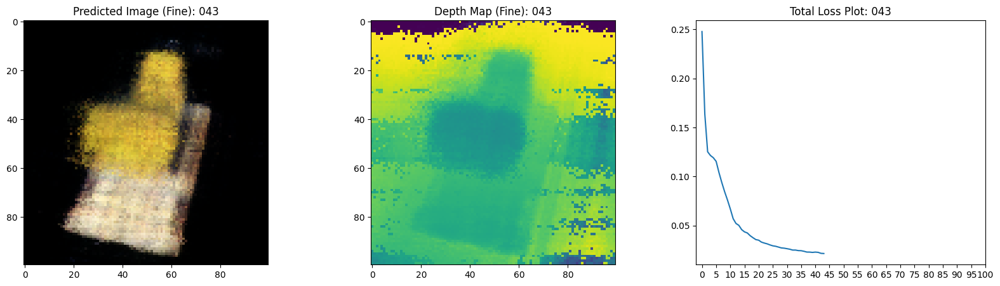

16/16 [==============================] - 8s 503ms/step - loss: 0.0212 - coarse_loss: 0.0104 - fine_loss: 0.0109 - coarse_psnr: 19.9734 - psnr: 19.7906 - val_loss: 0.0212 - val_coarse_loss: 0.0103 - val_fine_loss: 0.0110 - val_coarse_psnr: 19.9798 - val_psnr: 19.6970
Epoch 45/100
16/16 [==============================] - ETA: 0s - loss: 0.0207 - coarse_loss: 0.0104 - fine_loss: 0.0108 - coarse_psnr: 19.9970 - psnr: 19.9545

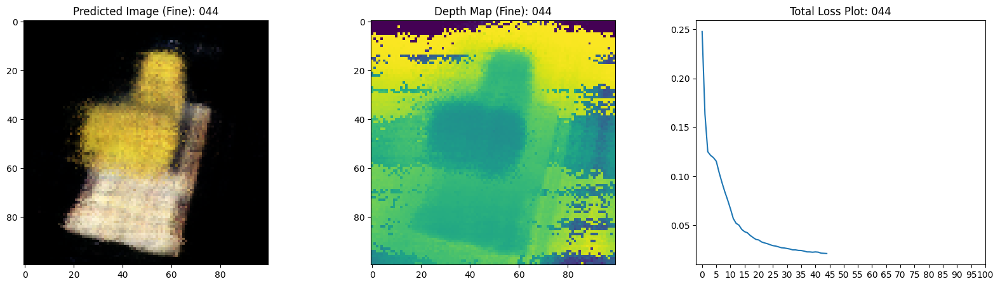

16/16 [==============================] - 8s 502ms/step - loss: 0.0207 - coarse_loss: 0.0104 - fine_loss: 0.0108 - coarse_psnr: 19.9970 - psnr: 19.9477 - val_loss: 0.0203 - val_coarse_loss: 0.0099 - val_fine_loss: 0.0104 - val_coarse_psnr: 20.1671 - val_psnr: 19.9395
Epoch 46/100
16/16 [==============================] - ETA: 0s - loss: 0.0209 - coarse_loss: 0.0103 - fine_loss: 0.0107 - coarse_psnr: 20.0282 - psnr: 19.8942

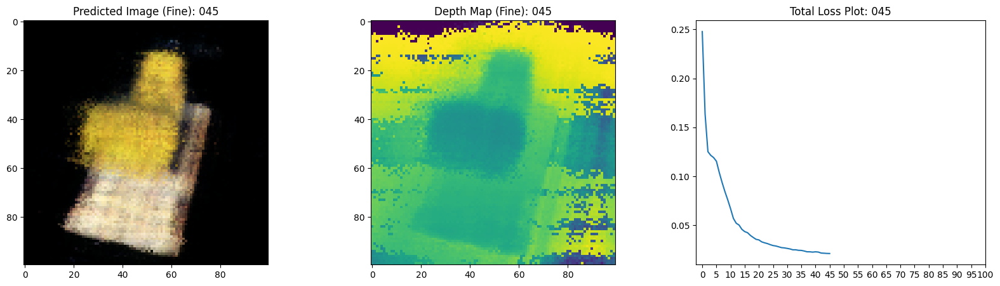

16/16 [==============================] - 8s 503ms/step - loss: 0.0209 - coarse_loss: 0.0103 - fine_loss: 0.0107 - coarse_psnr: 20.0282 - psnr: 19.8908 - val_loss: 0.0204 - val_coarse_loss: 0.0098 - val_fine_loss: 0.0106 - val_coarse_psnr: 20.1698 - val_psnr: 19.8397
Epoch 47/100
16/16 [==============================] - ETA: 0s - loss: 0.0210 - coarse_loss: 0.0102 - fine_loss: 0.0107 - coarse_psnr: 20.0880 - psnr: 19.8285

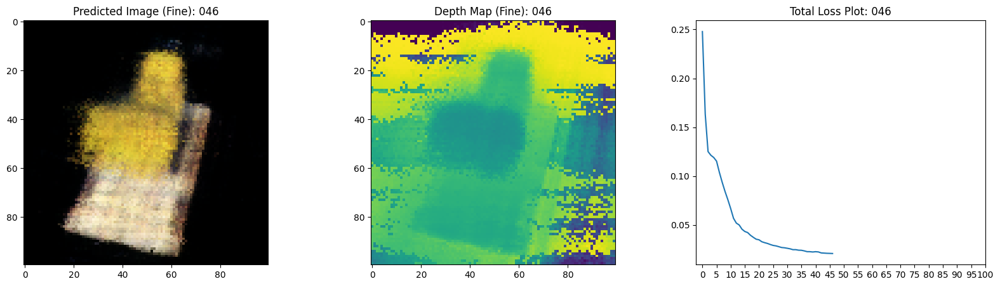

16/16 [==============================] - 8s 504ms/step - loss: 0.0210 - coarse_loss: 0.0102 - fine_loss: 0.0107 - coarse_psnr: 20.0880 - psnr: 19.8297 - val_loss: 0.0201 - val_coarse_loss: 0.0097 - val_fine_loss: 0.0105 - val_coarse_psnr: 20.2131 - val_psnr: 19.8882
Epoch 48/100
16/16 [==============================] - ETA: 0s - loss: 0.0204 - coarse_loss: 0.0099 - fine_loss: 0.0103 - coarse_psnr: 20.2376 - psnr: 19.9785

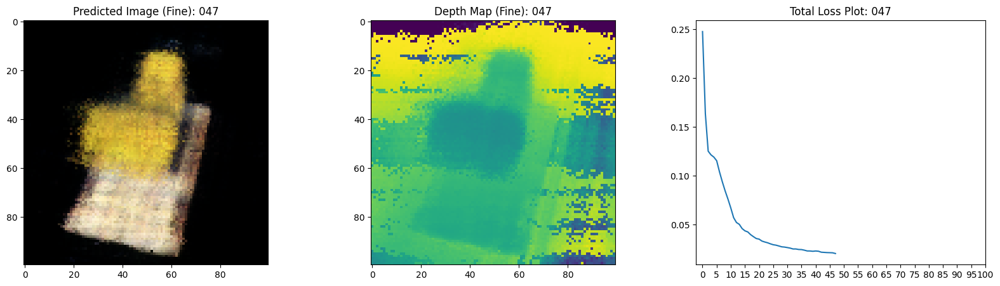

16/16 [==============================] - 8s 532ms/step - loss: 0.0204 - coarse_loss: 0.0099 - fine_loss: 0.0103 - coarse_psnr: 20.2376 - psnr: 19.9812 - val_loss: 0.0198 - val_coarse_loss: 0.0096 - val_fine_loss: 0.0102 - val_coarse_psnr: 20.3192 - val_psnr: 20.0485
Epoch 49/100
16/16 [==============================] - ETA: 0s - loss: 0.0200 - coarse_loss: 0.0099 - fine_loss: 0.0102 - coarse_psnr: 20.2197 - psnr: 20.1078

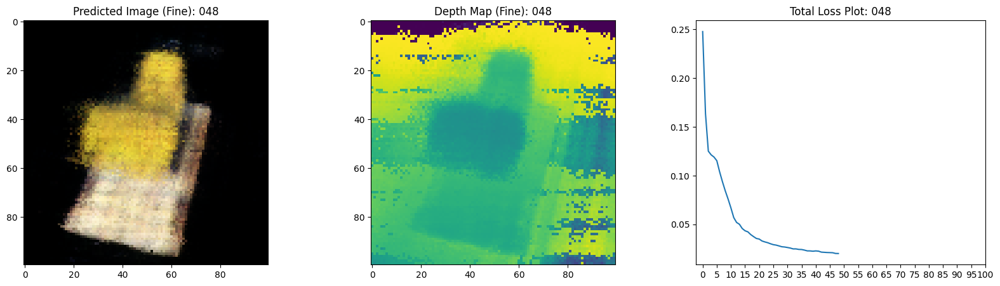

16/16 [==============================] - 8s 503ms/step - loss: 0.0200 - coarse_loss: 0.0099 - fine_loss: 0.0102 - coarse_psnr: 20.2197 - psnr: 20.1058 - val_loss: 0.0201 - val_coarse_loss: 0.0098 - val_fine_loss: 0.0103 - val_coarse_psnr: 20.1369 - val_psnr: 19.9561
Epoch 50/100
16/16 [==============================] - ETA: 0s - loss: 0.0202 - coarse_loss: 0.0098 - fine_loss: 0.0102 - coarse_psnr: 20.2335 - psnr: 20.0456

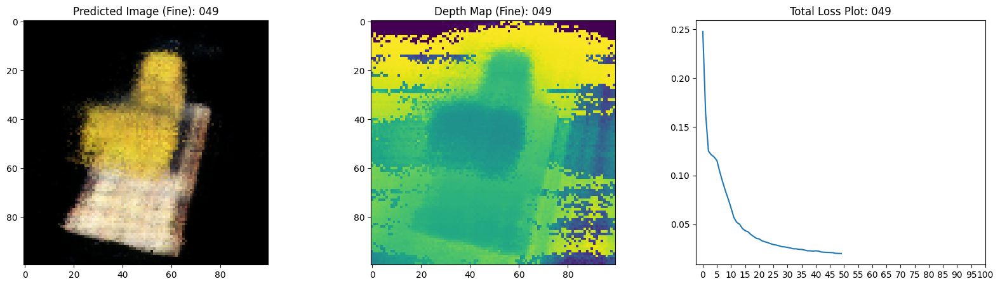

16/16 [==============================] - 8s 503ms/step - loss: 0.0202 - coarse_loss: 0.0098 - fine_loss: 0.0102 - coarse_psnr: 20.2335 - psnr: 20.0470 - val_loss: 0.0190 - val_coarse_loss: 0.0091 - val_fine_loss: 0.0099 - val_coarse_psnr: 20.4910 - val_psnr: 20.1653
Epoch 51/100
16/16 [==============================] - ETA: 0s - loss: 0.0197 - coarse_loss: 0.0097 - fine_loss: 0.0101 - coarse_psnr: 20.3285 - psnr: 20.1351

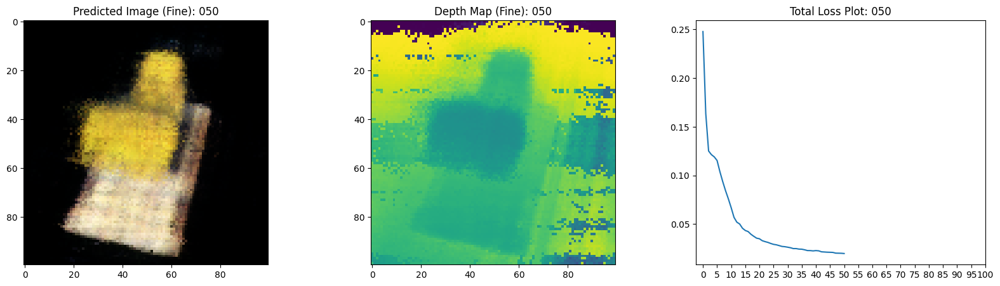

16/16 [==============================] - 8s 501ms/step - loss: 0.0197 - coarse_loss: 0.0097 - fine_loss: 0.0101 - coarse_psnr: 20.3285 - psnr: 20.1337 - val_loss: 0.0185 - val_coarse_loss: 0.0090 - val_fine_loss: 0.0095 - val_coarse_psnr: 20.5555 - val_psnr: 20.3300
Epoch 52/100
16/16 [==============================] - ETA: 0s - loss: 0.0199 - coarse_loss: 0.0095 - fine_loss: 0.0101 - coarse_psnr: 20.3738 - psnr: 20.0567

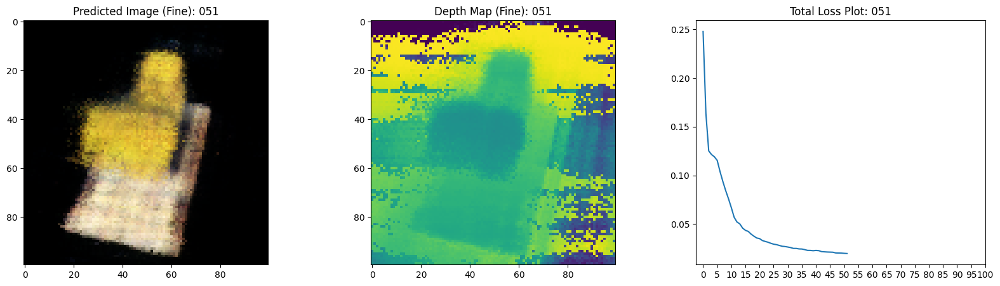

16/16 [==============================] - 8s 502ms/step - loss: 0.0199 - coarse_loss: 0.0095 - fine_loss: 0.0101 - coarse_psnr: 20.3738 - psnr: 20.0609 - val_loss: 0.0193 - val_coarse_loss: 0.0093 - val_fine_loss: 0.0100 - val_coarse_psnr: 20.4207 - val_psnr: 20.0844
Epoch 53/100
16/16 [==============================] - ETA: 0s - loss: 0.0194 - coarse_loss: 0.0094 - fine_loss: 0.0099 - coarse_psnr: 20.4252 - psnr: 20.1827

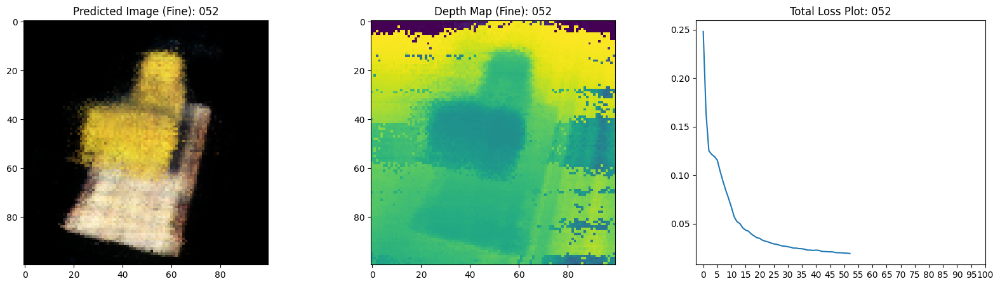

16/16 [==============================] - 8s 503ms/step - loss: 0.0194 - coarse_loss: 0.0094 - fine_loss: 0.0099 - coarse_psnr: 20.4252 - psnr: 20.1849 - val_loss: 0.0186 - val_coarse_loss: 0.0091 - val_fine_loss: 0.0096 - val_coarse_psnr: 20.5670 - val_psnr: 20.3419
Epoch 54/100
16/16 [==============================] - ETA: 0s - loss: 0.0190 - coarse_loss: 0.0094 - fine_loss: 0.0097 - coarse_psnr: 20.4395 - psnr: 20.3472

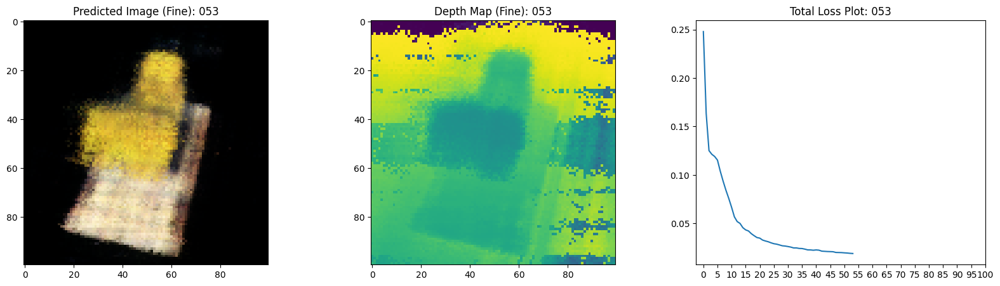

16/16 [==============================] - 8s 503ms/step - loss: 0.0190 - coarse_loss: 0.0094 - fine_loss: 0.0097 - coarse_psnr: 20.4395 - psnr: 20.3448 - val_loss: 0.0185 - val_coarse_loss: 0.0089 - val_fine_loss: 0.0095 - val_coarse_psnr: 20.6336 - val_psnr: 20.3576
Epoch 55/100
16/16 [==============================] - ETA: 0s - loss: 0.0191 - coarse_loss: 0.0094 - fine_loss: 0.0098 - coarse_psnr: 20.4345 - psnr: 20.2822

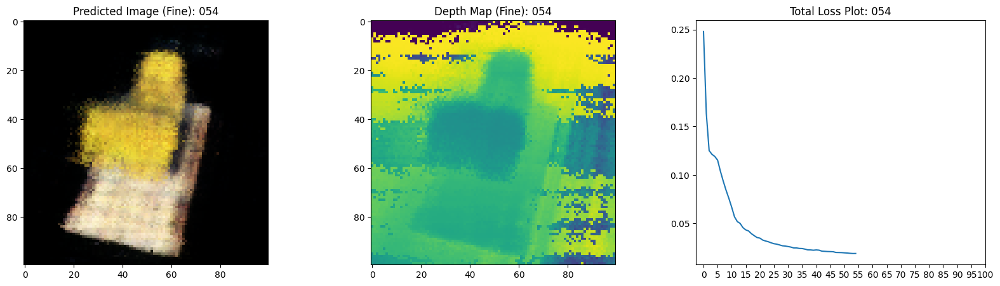

16/16 [==============================] - 8s 502ms/step - loss: 0.0191 - coarse_loss: 0.0094 - fine_loss: 0.0098 - coarse_psnr: 20.4345 - psnr: 20.2813 - val_loss: 0.0189 - val_coarse_loss: 0.0091 - val_fine_loss: 0.0098 - val_coarse_psnr: 20.4982 - val_psnr: 20.1578
Epoch 56/100
16/16 [==============================] - ETA: 0s - loss: 0.0190 - coarse_loss: 0.0093 - fine_loss: 0.0098 - coarse_psnr: 20.4544 - psnr: 20.2630

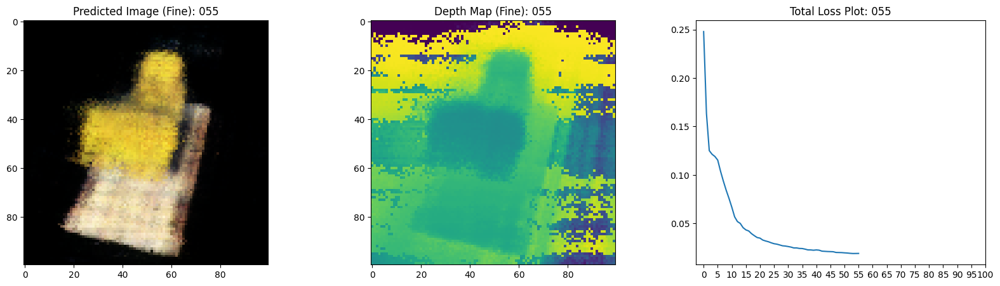

16/16 [==============================] - 8s 504ms/step - loss: 0.0190 - coarse_loss: 0.0093 - fine_loss: 0.0098 - coarse_psnr: 20.4544 - psnr: 20.2604 - val_loss: 0.0184 - val_coarse_loss: 0.0089 - val_fine_loss: 0.0095 - val_coarse_psnr: 20.6411 - val_psnr: 20.3247
Epoch 57/100
16/16 [==============================] - ETA: 0s - loss: 0.0187 - coarse_loss: 0.0092 - fine_loss: 0.0096 - coarse_psnr: 20.5357 - psnr: 20.3399

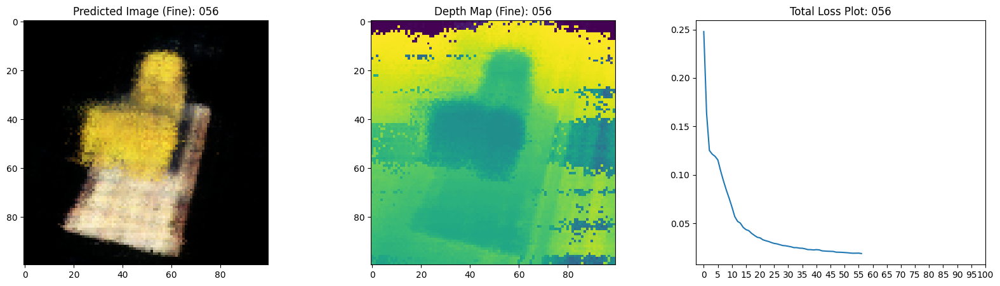

16/16 [==============================] - 8s 504ms/step - loss: 0.0187 - coarse_loss: 0.0092 - fine_loss: 0.0096 - coarse_psnr: 20.5357 - psnr: 20.3403 - val_loss: 0.0178 - val_coarse_loss: 0.0087 - val_fine_loss: 0.0091 - val_coarse_psnr: 20.7637 - val_psnr: 20.5522
Epoch 58/100
16/16 [==============================] - ETA: 0s - loss: 0.0185 - coarse_loss: 0.0091 - fine_loss: 0.0094 - coarse_psnr: 20.5644 - psnr: 20.4656

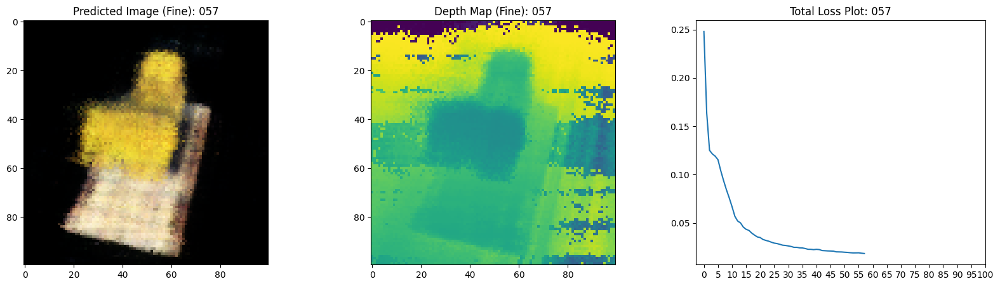

16/16 [==============================] - 8s 505ms/step - loss: 0.0185 - coarse_loss: 0.0091 - fine_loss: 0.0094 - coarse_psnr: 20.5644 - psnr: 20.4654 - val_loss: 0.0180 - val_coarse_loss: 0.0088 - val_fine_loss: 0.0092 - val_coarse_psnr: 20.6657 - val_psnr: 20.4805
Epoch 59/100
16/16 [==============================] - ETA: 0s - loss: 0.0187 - coarse_loss: 0.0093 - fine_loss: 0.0096 - coarse_psnr: 20.4671 - psnr: 20.3918

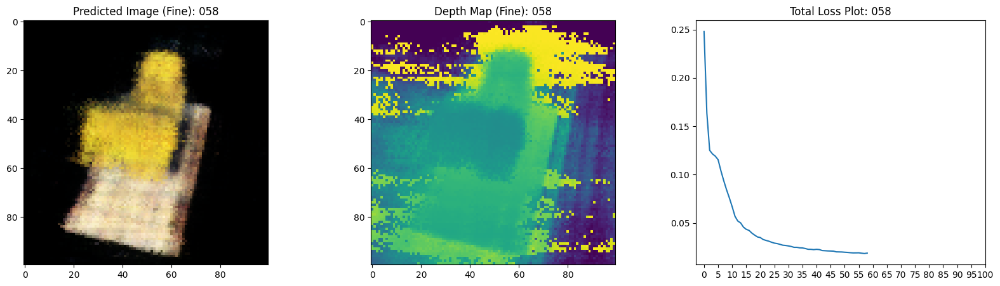

16/16 [==============================] - 8s 503ms/step - loss: 0.0187 - coarse_loss: 0.0093 - fine_loss: 0.0096 - coarse_psnr: 20.4671 - psnr: 20.3883 - val_loss: 0.0187 - val_coarse_loss: 0.0090 - val_fine_loss: 0.0097 - val_coarse_psnr: 20.5126 - val_psnr: 20.1981
Epoch 60/100
16/16 [==============================] - ETA: 0s - loss: 0.0193 - coarse_loss: 0.0091 - fine_loss: 0.0096 - coarse_psnr: 20.5752 - psnr: 20.2159

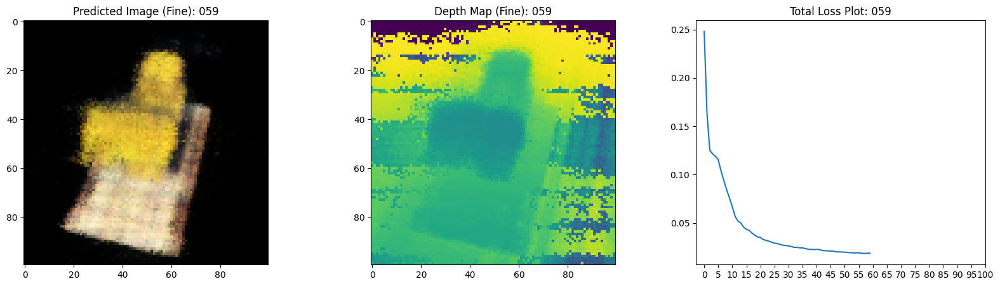

16/16 [==============================] - 8s 501ms/step - loss: 0.0192 - coarse_loss: 0.0091 - fine_loss: 0.0096 - coarse_psnr: 20.5752 - psnr: 20.2251 - val_loss: 0.0181 - val_coarse_loss: 0.0088 - val_fine_loss: 0.0093 - val_coarse_psnr: 20.6417 - val_psnr: 20.4179
Epoch 61/100
16/16 [==============================] - ETA: 0s - loss: 0.0184 - coarse_loss: 0.0090 - fine_loss: 0.0093 - coarse_psnr: 20.6172 - psnr: 20.4758

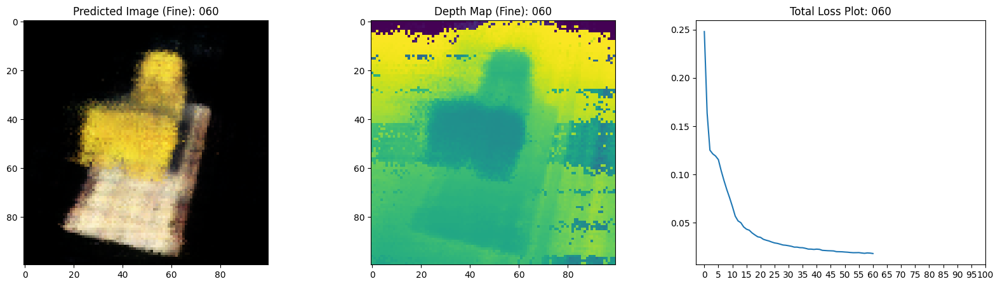

16/16 [==============================] - 8s 503ms/step - loss: 0.0184 - coarse_loss: 0.0090 - fine_loss: 0.0093 - coarse_psnr: 20.6172 - psnr: 20.4774 - val_loss: 0.0177 - val_coarse_loss: 0.0086 - val_fine_loss: 0.0090 - val_coarse_psnr: 20.7276 - val_psnr: 20.5468
Epoch 62/100
16/16 [==============================] - ETA: 0s - loss: 0.0182 - coarse_loss: 0.0088 - fine_loss: 0.0090 - coarse_psnr: 20.7383 - psnr: 20.5628

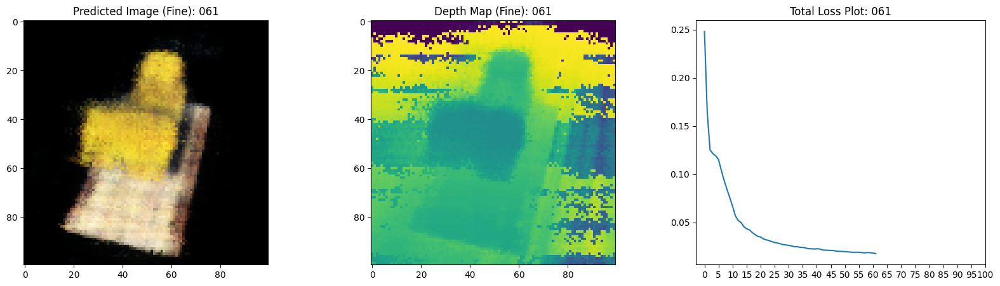

16/16 [==============================] - 8s 503ms/step - loss: 0.0181 - coarse_loss: 0.0088 - fine_loss: 0.0090 - coarse_psnr: 20.7383 - psnr: 20.5658 - val_loss: 0.0174 - val_coarse_loss: 0.0085 - val_fine_loss: 0.0089 - val_coarse_psnr: 20.8624 - val_psnr: 20.6162
Epoch 63/100
16/16 [==============================] - ETA: 0s - loss: 0.0181 - coarse_loss: 0.0088 - fine_loss: 0.0093 - coarse_psnr: 20.6983 - psnr: 20.4938

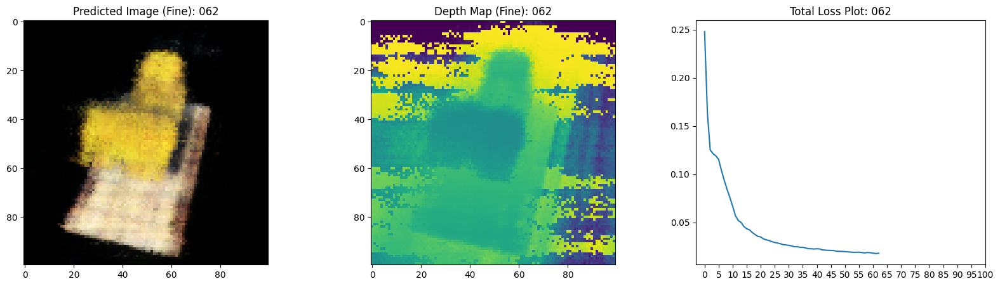

16/16 [==============================] - 9s 539ms/step - loss: 0.0181 - coarse_loss: 0.0088 - fine_loss: 0.0093 - coarse_psnr: 20.6983 - psnr: 20.4919 - val_loss: 0.0173 - val_coarse_loss: 0.0083 - val_fine_loss: 0.0090 - val_coarse_psnr: 20.8772 - val_psnr: 20.5025
Epoch 64/100
16/16 [==============================] - ETA: 0s - loss: 0.0180 - coarse_loss: 0.0087 - fine_loss: 0.0093 - coarse_psnr: 20.7530 - psnr: 20.4723

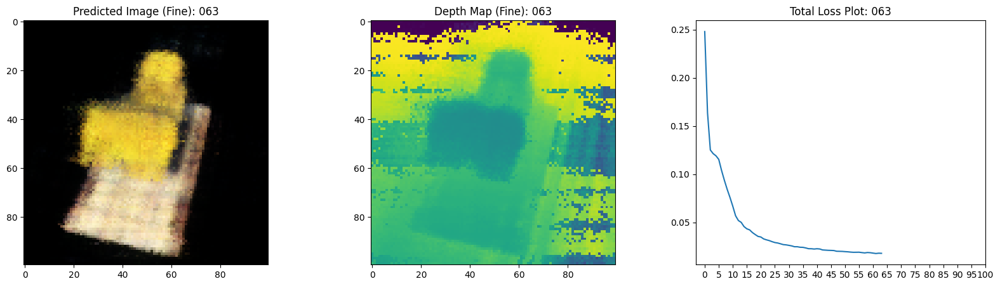

16/16 [==============================] - 8s 504ms/step - loss: 0.0180 - coarse_loss: 0.0087 - fine_loss: 0.0093 - coarse_psnr: 20.7530 - psnr: 20.4733 - val_loss: 0.0174 - val_coarse_loss: 0.0086 - val_fine_loss: 0.0088 - val_coarse_psnr: 20.7557 - val_psnr: 20.6132
Epoch 65/100
16/16 [==============================] - ETA: 0s - loss: 0.0180 - coarse_loss: 0.0088 - fine_loss: 0.0091 - coarse_psnr: 20.7090 - psnr: 20.5576

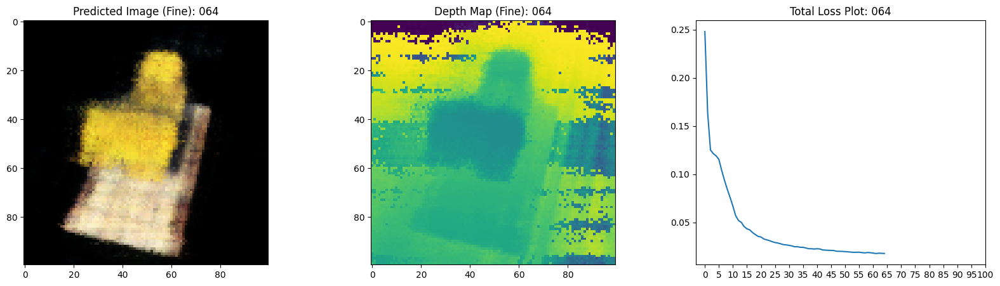

16/16 [==============================] - 8s 502ms/step - loss: 0.0180 - coarse_loss: 0.0088 - fine_loss: 0.0091 - coarse_psnr: 20.7090 - psnr: 20.5594 - val_loss: 0.0167 - val_coarse_loss: 0.0083 - val_fine_loss: 0.0085 - val_coarse_psnr: 20.9505 - val_psnr: 20.8736
Epoch 66/100
16/16 [==============================] - ETA: 0s - loss: 0.0176 - coarse_loss: 0.0087 - fine_loss: 0.0089 - coarse_psnr: 20.7972 - psnr: 20.7143

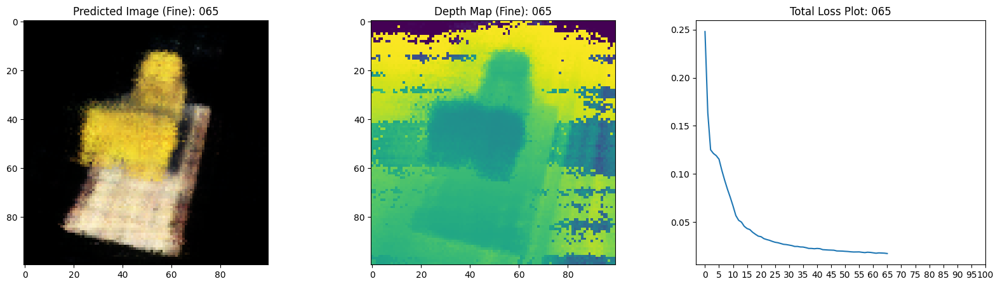

16/16 [==============================] - 8s 505ms/step - loss: 0.0176 - coarse_loss: 0.0087 - fine_loss: 0.0089 - coarse_psnr: 20.7972 - psnr: 20.7142 - val_loss: 0.0167 - val_coarse_loss: 0.0081 - val_fine_loss: 0.0086 - val_coarse_psnr: 21.0357 - val_psnr: 20.8075
Epoch 67/100
16/16 [==============================] - ETA: 0s - loss: 0.0174 - coarse_loss: 0.0087 - fine_loss: 0.0089 - coarse_psnr: 20.7799 - psnr: 20.7202

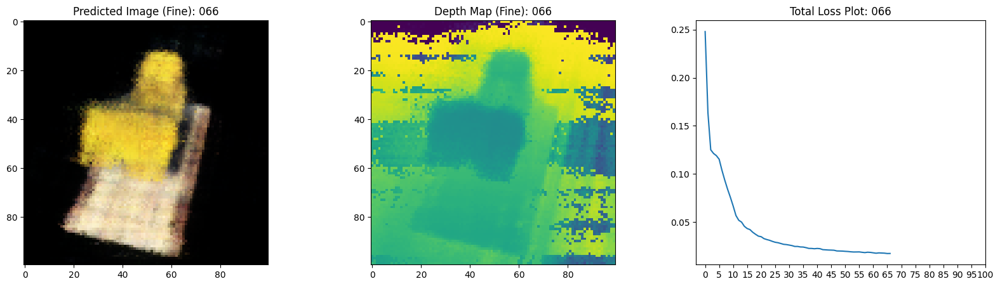

16/16 [==============================] - 8s 504ms/step - loss: 0.0174 - coarse_loss: 0.0087 - fine_loss: 0.0089 - coarse_psnr: 20.7799 - psnr: 20.7182 - val_loss: 0.0163 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0083 - val_coarse_psnr: 21.0834 - val_psnr: 20.9265
Epoch 68/100
16/16 [==============================] - ETA: 0s - loss: 0.0174 - coarse_loss: 0.0086 - fine_loss: 0.0088 - coarse_psnr: 20.8311 - psnr: 20.7186

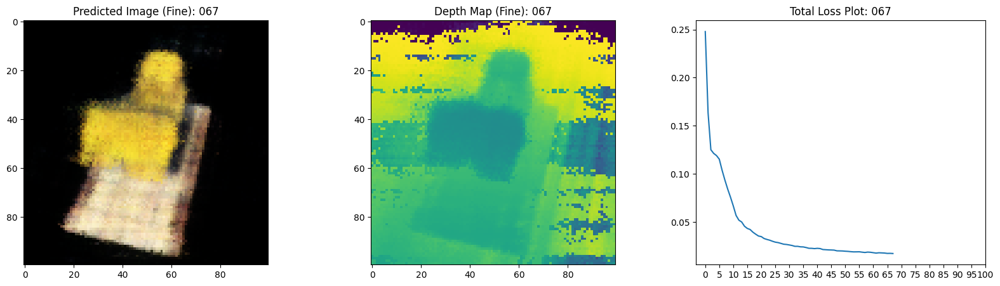

16/16 [==============================] - 8s 503ms/step - loss: 0.0174 - coarse_loss: 0.0086 - fine_loss: 0.0088 - coarse_psnr: 20.8311 - psnr: 20.7179 - val_loss: 0.0160 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0082 - val_coarse_psnr: 21.2071 - val_psnr: 21.0062
Epoch 69/100
16/16 [==============================] - ETA: 0s - loss: 0.0170 - coarse_loss: 0.0084 - fine_loss: 0.0087 - coarse_psnr: 20.9280 - psnr: 20.8146

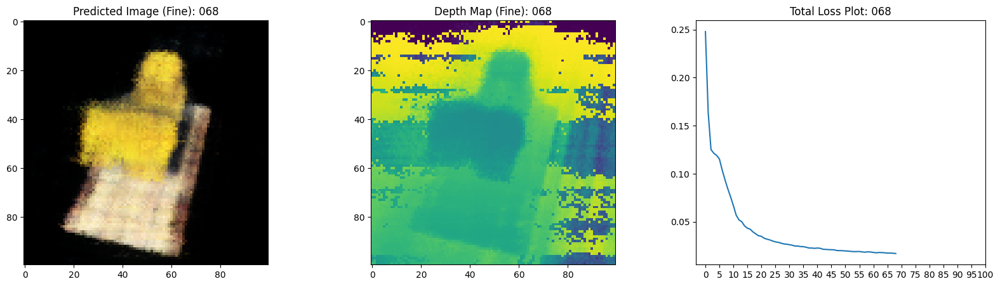

16/16 [==============================] - 8s 503ms/step - loss: 0.0170 - coarse_loss: 0.0084 - fine_loss: 0.0087 - coarse_psnr: 20.9280 - psnr: 20.8129 - val_loss: 0.0168 - val_coarse_loss: 0.0081 - val_fine_loss: 0.0087 - val_coarse_psnr: 20.9871 - val_psnr: 20.6984
Epoch 70/100
16/16 [==============================] - ETA: 0s - loss: 0.0172 - coarse_loss: 0.0084 - fine_loss: 0.0087 - coarse_psnr: 20.9260 - psnr: 20.7391

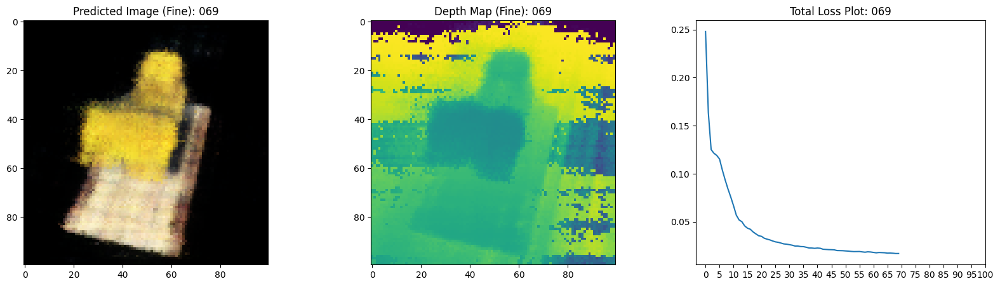

16/16 [==============================] - 8s 503ms/step - loss: 0.0172 - coarse_loss: 0.0084 - fine_loss: 0.0087 - coarse_psnr: 20.9260 - psnr: 20.7418 - val_loss: 0.0159 - val_coarse_loss: 0.0077 - val_fine_loss: 0.0082 - val_coarse_psnr: 21.2475 - val_psnr: 20.9901
Epoch 71/100
16/16 [==============================] - ETA: 0s - loss: 0.0171 - coarse_loss: 0.0082 - fine_loss: 0.0087 - coarse_psnr: 21.0168 - psnr: 20.7545

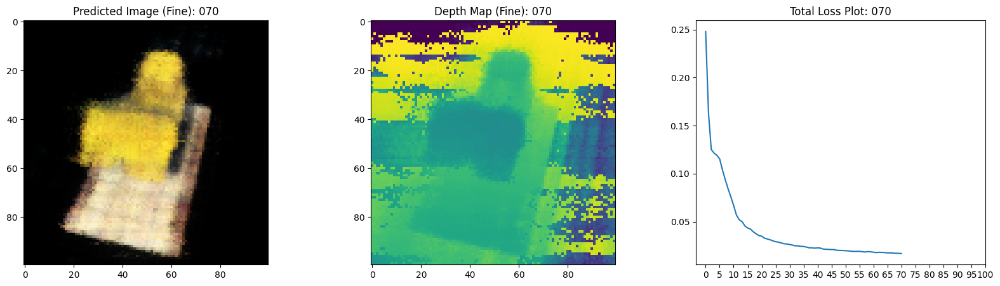

16/16 [==============================] - 8s 502ms/step - loss: 0.0171 - coarse_loss: 0.0082 - fine_loss: 0.0087 - coarse_psnr: 21.0168 - psnr: 20.7574 - val_loss: 0.0161 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0083 - val_coarse_psnr: 21.1894 - val_psnr: 20.9201
Epoch 72/100
16/16 [==============================] - ETA: 0s - loss: 0.0169 - coarse_loss: 0.0082 - fine_loss: 0.0086 - coarse_psnr: 21.0309 - psnr: 20.7887

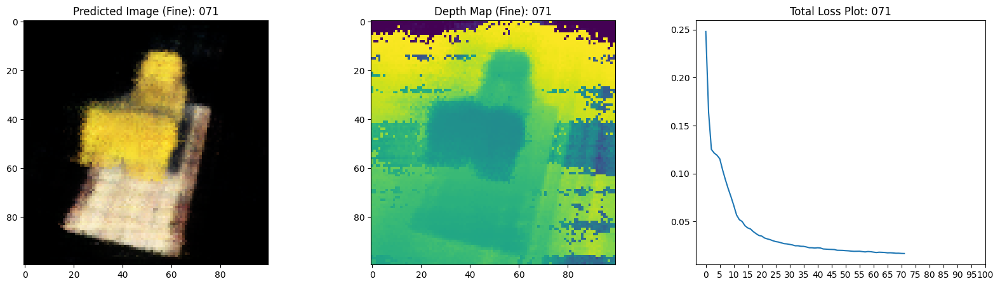

16/16 [==============================] - 8s 506ms/step - loss: 0.0169 - coarse_loss: 0.0082 - fine_loss: 0.0086 - coarse_psnr: 21.0309 - psnr: 20.7920 - val_loss: 0.0162 - val_coarse_loss: 0.0080 - val_fine_loss: 0.0082 - val_coarse_psnr: 21.0722 - val_psnr: 21.0139
Epoch 73/100
16/16 [==============================] - ETA: 0s - loss: 0.0169 - coarse_loss: 0.0082 - fine_loss: 0.0084 - coarse_psnr: 21.0431 - psnr: 20.8539

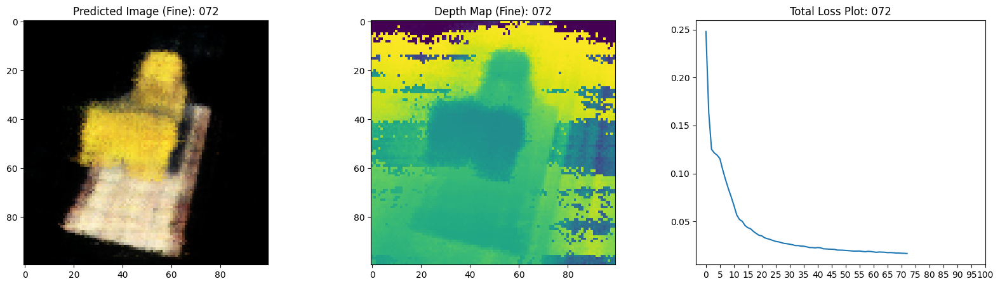

16/16 [==============================] - 8s 503ms/step - loss: 0.0169 - coarse_loss: 0.0082 - fine_loss: 0.0084 - coarse_psnr: 21.0431 - psnr: 20.8579 - val_loss: 0.0156 - val_coarse_loss: 0.0076 - val_fine_loss: 0.0080 - val_coarse_psnr: 21.2685 - val_psnr: 21.0248
Epoch 74/100
16/16 [==============================] - ETA: 0s - loss: 0.0166 - coarse_loss: 0.0082 - fine_loss: 0.0083 - coarse_psnr: 21.0574 - psnr: 20.9469

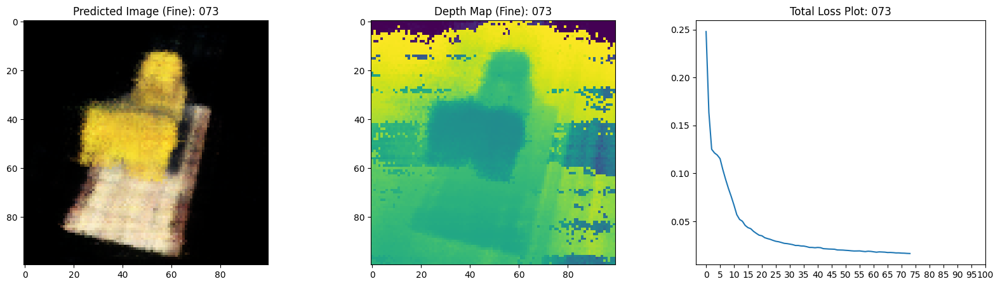

16/16 [==============================] - 8s 504ms/step - loss: 0.0166 - coarse_loss: 0.0082 - fine_loss: 0.0083 - coarse_psnr: 21.0574 - psnr: 20.9501 - val_loss: 0.0161 - val_coarse_loss: 0.0079 - val_fine_loss: 0.0083 - val_coarse_psnr: 21.1421 - val_psnr: 20.9206
Epoch 75/100
16/16 [==============================] - ETA: 0s - loss: 0.0166 - coarse_loss: 0.0083 - fine_loss: 0.0083 - coarse_psnr: 20.9531 - psnr: 21.0152

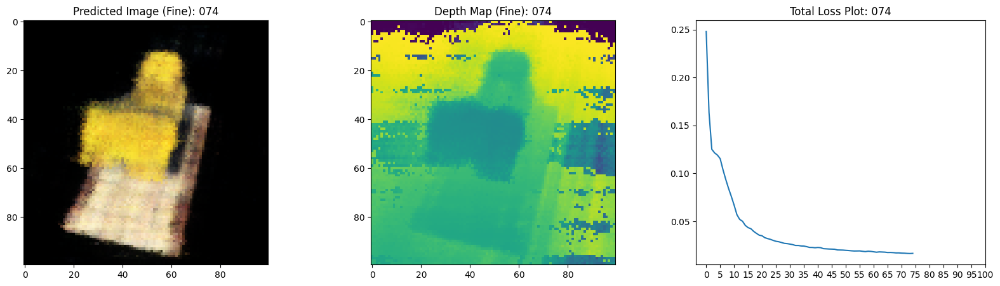

16/16 [==============================] - 8s 502ms/step - loss: 0.0166 - coarse_loss: 0.0083 - fine_loss: 0.0083 - coarse_psnr: 20.9531 - psnr: 21.0150 - val_loss: 0.0158 - val_coarse_loss: 0.0077 - val_fine_loss: 0.0081 - val_coarse_psnr: 21.2399 - val_psnr: 21.0097
Epoch 76/100
16/16 [==============================] - ETA: 0s - loss: 0.0166 - coarse_loss: 0.0081 - fine_loss: 0.0082 - coarse_psnr: 21.0597 - psnr: 20.9728

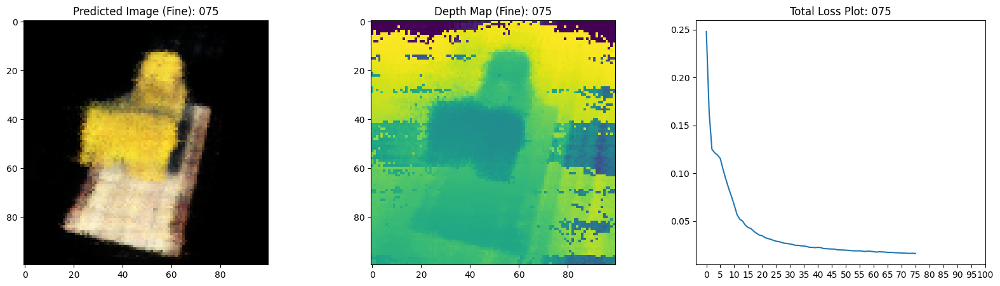

16/16 [==============================] - 8s 503ms/step - loss: 0.0166 - coarse_loss: 0.0081 - fine_loss: 0.0082 - coarse_psnr: 21.0597 - psnr: 20.9770 - val_loss: 0.0156 - val_coarse_loss: 0.0076 - val_fine_loss: 0.0080 - val_coarse_psnr: 21.3087 - val_psnr: 21.1328
Epoch 77/100
16/16 [==============================] - ETA: 0s - loss: 0.0164 - coarse_loss: 0.0080 - fine_loss: 0.0082 - coarse_psnr: 21.1326 - psnr: 20.9938

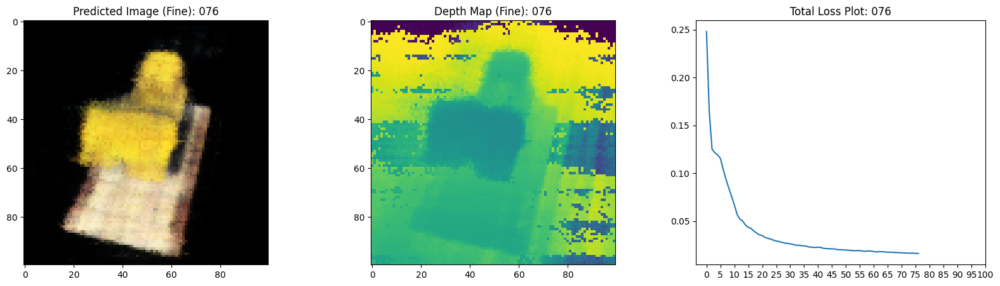

16/16 [==============================] - 8s 505ms/step - loss: 0.0164 - coarse_loss: 0.0080 - fine_loss: 0.0082 - coarse_psnr: 21.1326 - psnr: 20.9990 - val_loss: 0.0158 - val_coarse_loss: 0.0078 - val_fine_loss: 0.0080 - val_coarse_psnr: 21.1827 - val_psnr: 21.0540
Epoch 78/100
16/16 [==============================] - ETA: 0s - loss: 0.0164 - coarse_loss: 0.0081 - fine_loss: 0.0082 - coarse_psnr: 21.0791 - psnr: 20.9916

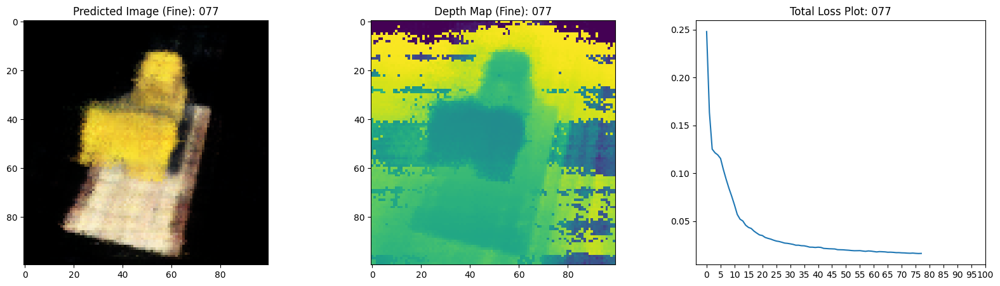

16/16 [==============================] - 8s 525ms/step - loss: 0.0164 - coarse_loss: 0.0081 - fine_loss: 0.0082 - coarse_psnr: 21.0791 - psnr: 20.9947 - val_loss: 0.0155 - val_coarse_loss: 0.0076 - val_fine_loss: 0.0079 - val_coarse_psnr: 21.3034 - val_psnr: 21.1663
Epoch 79/100
16/16 [==============================] - ETA: 0s - loss: 0.0165 - coarse_loss: 0.0081 - fine_loss: 0.0082 - coarse_psnr: 21.1092 - psnr: 20.9955

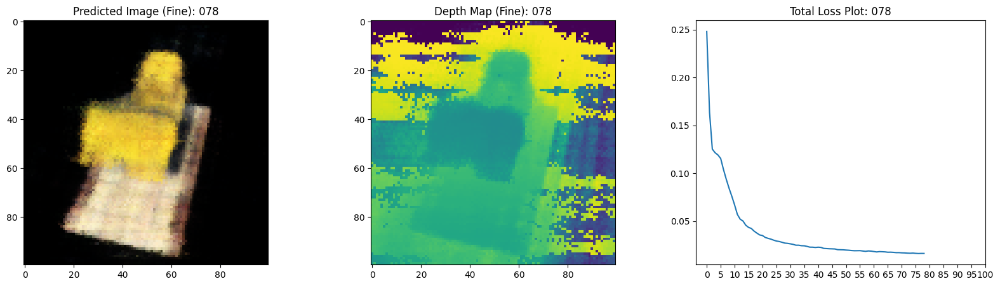

16/16 [==============================] - 8s 505ms/step - loss: 0.0164 - coarse_loss: 0.0081 - fine_loss: 0.0082 - coarse_psnr: 21.1092 - psnr: 20.9999 - val_loss: 0.0158 - val_coarse_loss: 0.0077 - val_fine_loss: 0.0081 - val_coarse_psnr: 21.2354 - val_psnr: 21.0133
Epoch 80/100
16/16 [==============================] - ETA: 0s - loss: 0.0162 - coarse_loss: 0.0080 - fine_loss: 0.0082 - coarse_psnr: 21.1122 - psnr: 21.0387

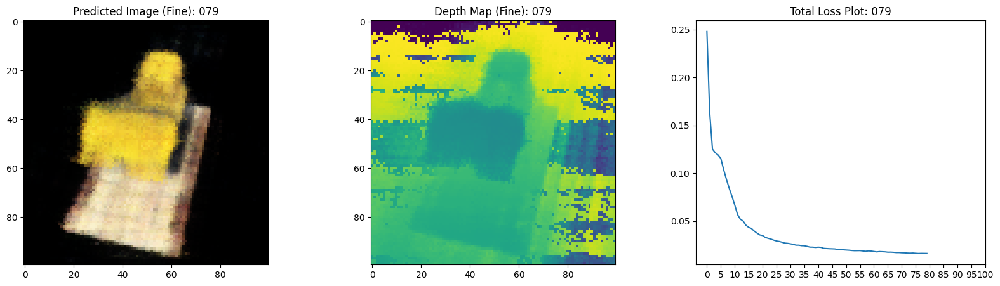

16/16 [==============================] - 8s 504ms/step - loss: 0.0162 - coarse_loss: 0.0080 - fine_loss: 0.0082 - coarse_psnr: 21.1122 - psnr: 21.0403 - val_loss: 0.0151 - val_coarse_loss: 0.0075 - val_fine_loss: 0.0077 - val_coarse_psnr: 21.3724 - val_psnr: 21.2672
Epoch 81/100
16/16 [==============================] - ETA: 0s - loss: 0.0162 - coarse_loss: 0.0081 - fine_loss: 0.0082 - coarse_psnr: 21.1125 - psnr: 21.0679

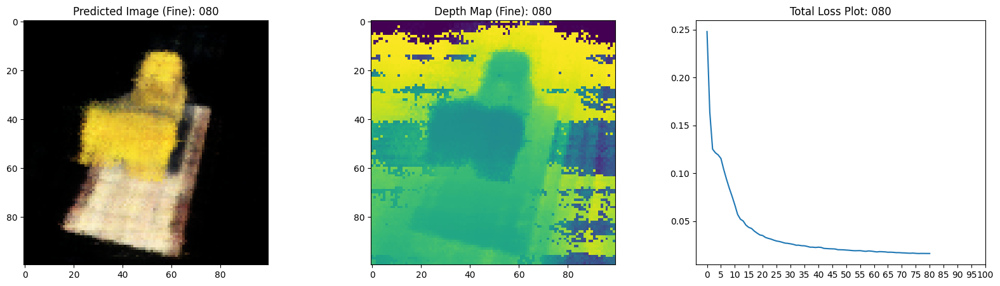

16/16 [==============================] - 8s 507ms/step - loss: 0.0162 - coarse_loss: 0.0081 - fine_loss: 0.0082 - coarse_psnr: 21.1125 - psnr: 21.0684 - val_loss: 0.0154 - val_coarse_loss: 0.0076 - val_fine_loss: 0.0078 - val_coarse_psnr: 21.3312 - val_psnr: 21.1868
Epoch 82/100
16/16 [==============================] - ETA: 0s - loss: 0.0161 - coarse_loss: 0.0078 - fine_loss: 0.0080 - coarse_psnr: 21.2637 - psnr: 21.0549

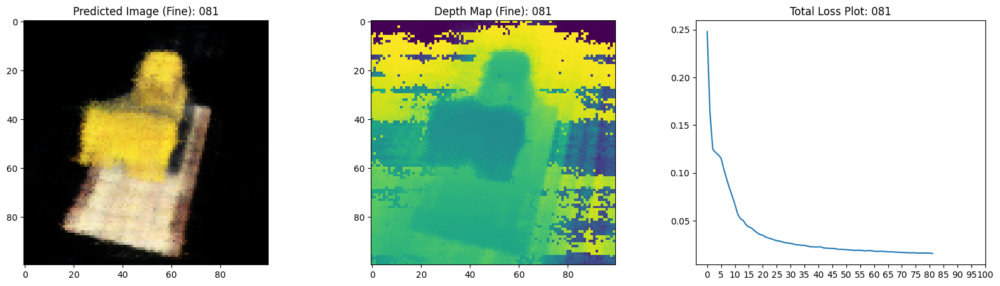

16/16 [==============================] - 8s 504ms/step - loss: 0.0161 - coarse_loss: 0.0078 - fine_loss: 0.0080 - coarse_psnr: 21.2637 - psnr: 21.0606 - val_loss: 0.0152 - val_coarse_loss: 0.0074 - val_fine_loss: 0.0077 - val_coarse_psnr: 21.4003 - val_psnr: 21.2456
Epoch 83/100
16/16 [==============================] - ETA: 0s - loss: 0.0162 - coarse_loss: 0.0081 - fine_loss: 0.0082 - coarse_psnr: 21.1156 - psnr: 21.0281

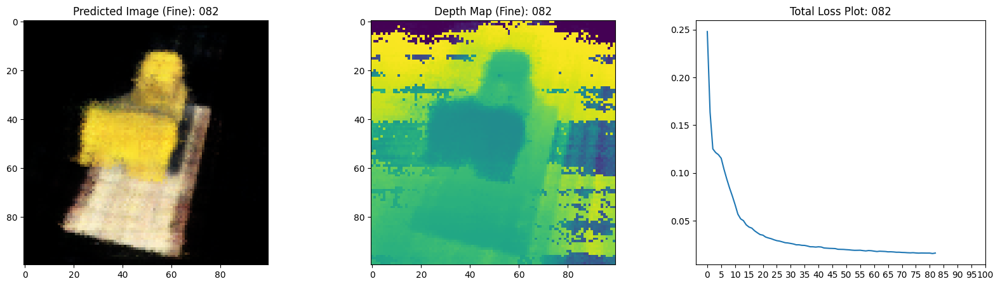

16/16 [==============================] - 8s 505ms/step - loss: 0.0162 - coarse_loss: 0.0081 - fine_loss: 0.0082 - coarse_psnr: 21.1156 - psnr: 21.0316 - val_loss: 0.0157 - val_coarse_loss: 0.0079 - val_fine_loss: 0.0077 - val_coarse_psnr: 21.0756 - val_psnr: 21.1814
Epoch 84/100
16/16 [==============================] - ETA: 0s - loss: 0.0161 - coarse_loss: 0.0079 - fine_loss: 0.0078 - coarse_psnr: 21.2082 - psnr: 21.1669

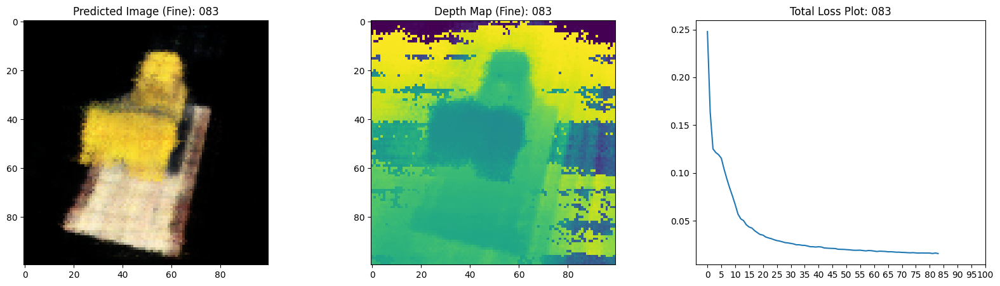

16/16 [==============================] - 8s 504ms/step - loss: 0.0160 - coarse_loss: 0.0079 - fine_loss: 0.0078 - coarse_psnr: 21.2082 - psnr: 21.1725 - val_loss: 0.0150 - val_coarse_loss: 0.0074 - val_fine_loss: 0.0076 - val_coarse_psnr: 21.4604 - val_psnr: 21.3306
Epoch 85/100
16/16 [==============================] - ETA: 0s - loss: 0.0156 - coarse_loss: 0.0077 - fine_loss: 0.0078 - coarse_psnr: 21.2862 - psnr: 21.2490

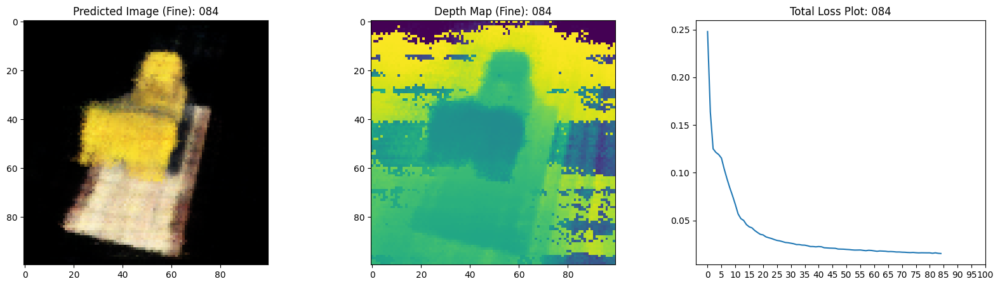

16/16 [==============================] - 8s 503ms/step - loss: 0.0156 - coarse_loss: 0.0077 - fine_loss: 0.0078 - coarse_psnr: 21.2862 - psnr: 21.2521 - val_loss: 0.0150 - val_coarse_loss: 0.0074 - val_fine_loss: 0.0076 - val_coarse_psnr: 21.3988 - val_psnr: 21.2544
Epoch 86/100
16/16 [==============================] - ETA: 0s - loss: 0.0157 - coarse_loss: 0.0077 - fine_loss: 0.0078 - coarse_psnr: 21.3132 - psnr: 21.2155

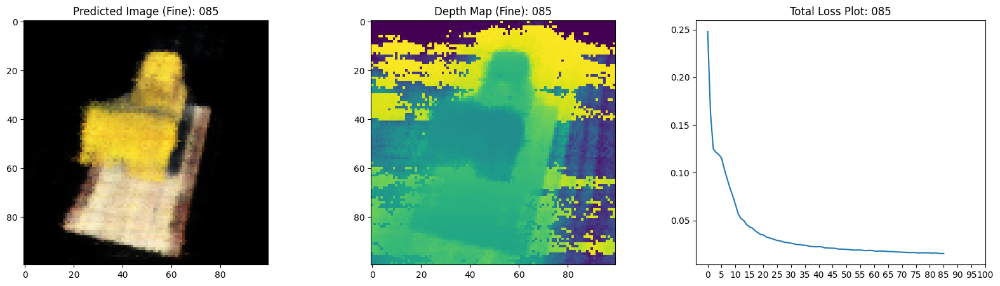

16/16 [==============================] - 8s 503ms/step - loss: 0.0157 - coarse_loss: 0.0077 - fine_loss: 0.0078 - coarse_psnr: 21.3132 - psnr: 21.2173 - val_loss: 0.0148 - val_coarse_loss: 0.0072 - val_fine_loss: 0.0076 - val_coarse_psnr: 21.5257 - val_psnr: 21.3218
Epoch 87/100
16/16 [==============================] - ETA: 0s - loss: 0.0157 - coarse_loss: 0.0076 - fine_loss: 0.0079 - coarse_psnr: 21.3465 - psnr: 21.1636

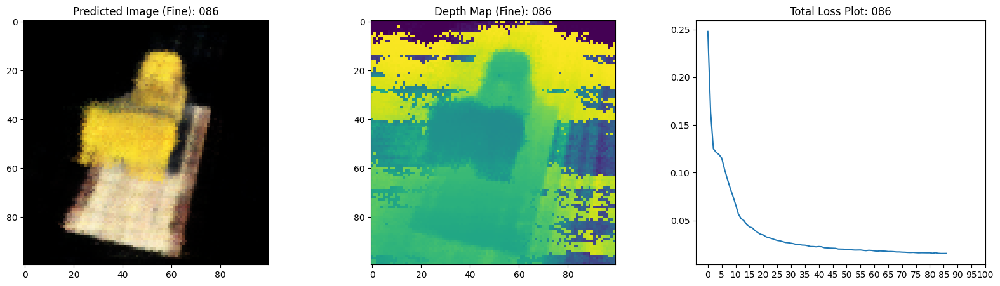

16/16 [==============================] - 8s 502ms/step - loss: 0.0157 - coarse_loss: 0.0076 - fine_loss: 0.0079 - coarse_psnr: 21.3465 - psnr: 21.1658 - val_loss: 0.0147 - val_coarse_loss: 0.0072 - val_fine_loss: 0.0075 - val_coarse_psnr: 21.5350 - val_psnr: 21.3968
Epoch 88/100
16/16 [==============================] - ETA: 0s - loss: 0.0156 - coarse_loss: 0.0076 - fine_loss: 0.0077 - coarse_psnr: 21.3373 - psnr: 21.2202

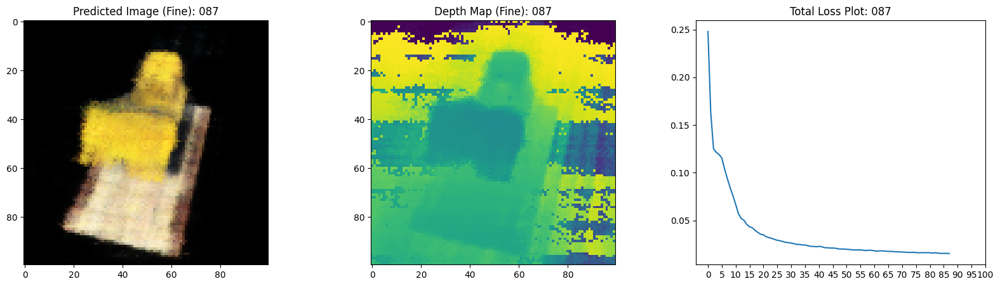

16/16 [==============================] - 8s 503ms/step - loss: 0.0156 - coarse_loss: 0.0076 - fine_loss: 0.0077 - coarse_psnr: 21.3373 - psnr: 21.2254 - val_loss: 0.0146 - val_coarse_loss: 0.0072 - val_fine_loss: 0.0074 - val_coarse_psnr: 21.5392 - val_psnr: 21.4746
Epoch 89/100
16/16 [==============================] - ETA: 0s - loss: 0.0155 - coarse_loss: 0.0077 - fine_loss: 0.0077 - coarse_psnr: 21.3138 - psnr: 21.3049

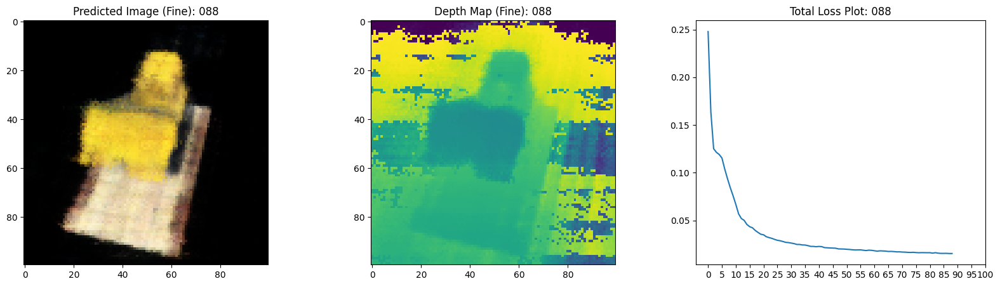

16/16 [==============================] - 8s 503ms/step - loss: 0.0155 - coarse_loss: 0.0077 - fine_loss: 0.0077 - coarse_psnr: 21.3138 - psnr: 21.3067 - val_loss: 0.0144 - val_coarse_loss: 0.0071 - val_fine_loss: 0.0074 - val_coarse_psnr: 21.5681 - val_psnr: 21.3967
Epoch 90/100
16/16 [==============================] - ETA: 0s - loss: 0.0153 - coarse_loss: 0.0076 - fine_loss: 0.0077 - coarse_psnr: 21.3616 - psnr: 21.3085

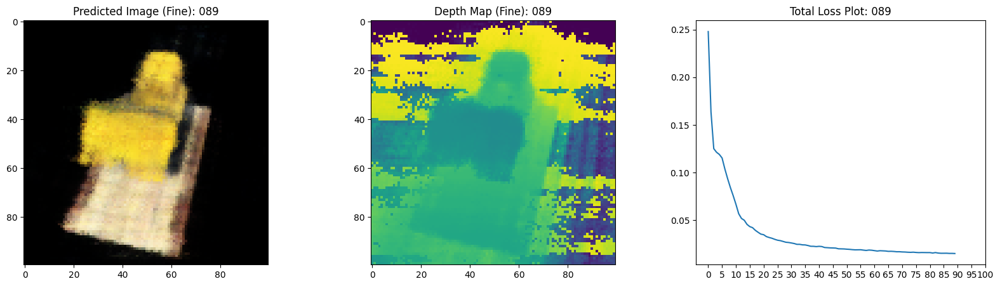

16/16 [==============================] - 8s 503ms/step - loss: 0.0153 - coarse_loss: 0.0076 - fine_loss: 0.0077 - coarse_psnr: 21.3616 - psnr: 21.3097 - val_loss: 0.0148 - val_coarse_loss: 0.0073 - val_fine_loss: 0.0076 - val_coarse_psnr: 21.5169 - val_psnr: 21.3333
Epoch 91/100
16/16 [==============================] - ETA: 0s - loss: 0.0156 - coarse_loss: 0.0076 - fine_loss: 0.0078 - coarse_psnr: 21.3511 - psnr: 21.2136

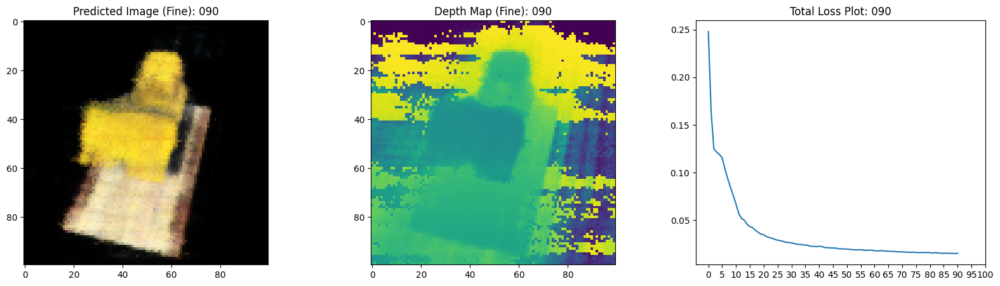

16/16 [==============================] - 8s 503ms/step - loss: 0.0156 - coarse_loss: 0.0076 - fine_loss: 0.0078 - coarse_psnr: 21.3511 - psnr: 21.2157 - val_loss: 0.0150 - val_coarse_loss: 0.0073 - val_fine_loss: 0.0077 - val_coarse_psnr: 21.4799 - val_psnr: 21.2566
Epoch 92/100
16/16 [==============================] - ETA: 0s - loss: 0.0156 - coarse_loss: 0.0077 - fine_loss: 0.0079 - coarse_psnr: 21.2804 - psnr: 21.1937

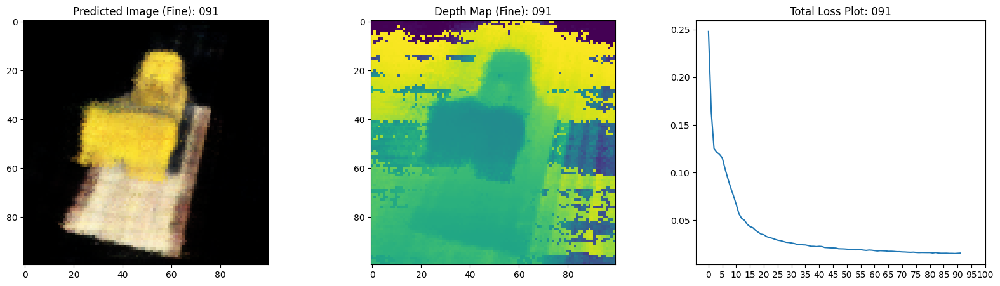

16/16 [==============================] - 8s 503ms/step - loss: 0.0156 - coarse_loss: 0.0077 - fine_loss: 0.0079 - coarse_psnr: 21.2804 - psnr: 21.1934 - val_loss: 0.0148 - val_coarse_loss: 0.0073 - val_fine_loss: 0.0075 - val_coarse_psnr: 21.4744 - val_psnr: 21.3640
Epoch 93/100
16/16 [==============================] - ETA: 0s - loss: 0.0152 - coarse_loss: 0.0075 - fine_loss: 0.0076 - coarse_psnr: 21.4038 - psnr: 21.3245

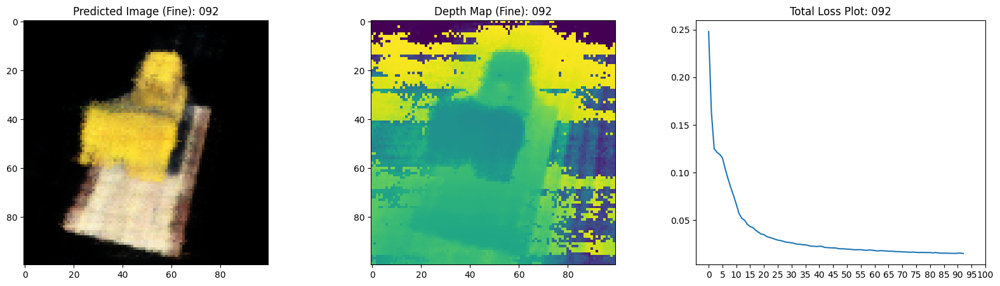

16/16 [==============================] - 8s 503ms/step - loss: 0.0152 - coarse_loss: 0.0075 - fine_loss: 0.0076 - coarse_psnr: 21.4038 - psnr: 21.3268 - val_loss: 0.0145 - val_coarse_loss: 0.0072 - val_fine_loss: 0.0073 - val_coarse_psnr: 21.5208 - val_psnr: 21.4796
Epoch 94/100
16/16 [==============================] - ETA: 0s - loss: 0.0151 - coarse_loss: 0.0075 - fine_loss: 0.0075 - coarse_psnr: 21.3878 - psnr: 21.3834

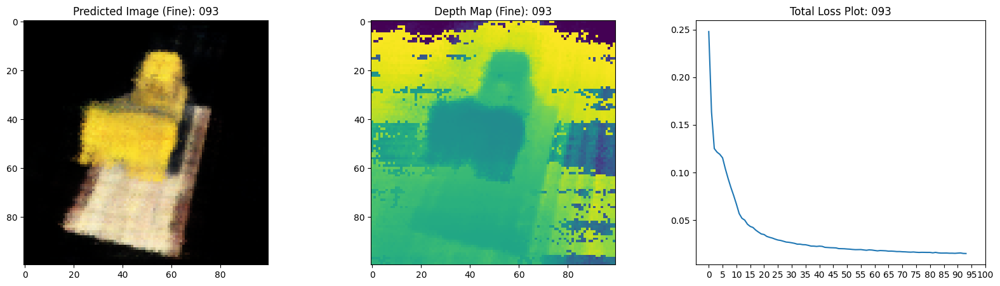

16/16 [==============================] - 8s 528ms/step - loss: 0.0151 - coarse_loss: 0.0075 - fine_loss: 0.0075 - coarse_psnr: 21.3878 - psnr: 21.3861 - val_loss: 0.0146 - val_coarse_loss: 0.0073 - val_fine_loss: 0.0073 - val_coarse_psnr: 21.4486 - val_psnr: 21.4730
Epoch 95/100
16/16 [==============================] - ETA: 0s - loss: 0.0150 - coarse_loss: 0.0075 - fine_loss: 0.0074 - coarse_psnr: 21.4019 - psnr: 21.4653

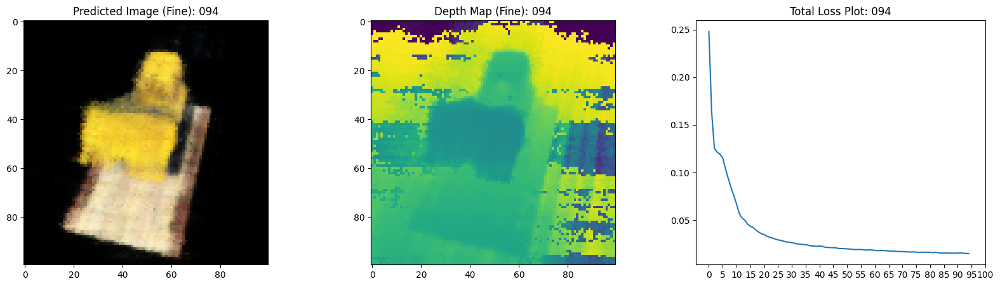

16/16 [==============================] - 8s 503ms/step - loss: 0.0150 - coarse_loss: 0.0075 - fine_loss: 0.0074 - coarse_psnr: 21.4019 - psnr: 21.4662 - val_loss: 0.0144 - val_coarse_loss: 0.0073 - val_fine_loss: 0.0071 - val_coarse_psnr: 21.4927 - val_psnr: 21.6098
Epoch 96/100
16/16 [==============================] - ETA: 0s - loss: 0.0150 - coarse_loss: 0.0075 - fine_loss: 0.0073 - coarse_psnr: 21.4496 - psnr: 21.4876

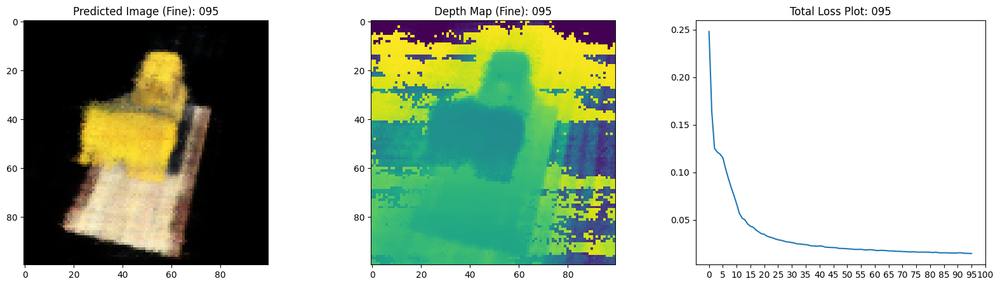

16/16 [==============================] - 8s 504ms/step - loss: 0.0150 - coarse_loss: 0.0075 - fine_loss: 0.0073 - coarse_psnr: 21.4496 - psnr: 21.4902 - val_loss: 0.0142 - val_coarse_loss: 0.0070 - val_fine_loss: 0.0072 - val_coarse_psnr: 21.6631 - val_psnr: 21.5623
Epoch 97/100
16/16 [==============================] - ETA: 0s - loss: 0.0148 - coarse_loss: 0.0074 - fine_loss: 0.0074 - coarse_psnr: 21.4553 - psnr: 21.4908

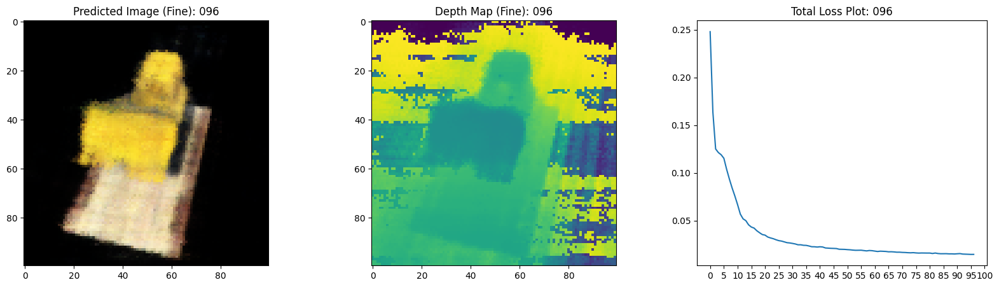

16/16 [==============================] - 8s 505ms/step - loss: 0.0148 - coarse_loss: 0.0074 - fine_loss: 0.0074 - coarse_psnr: 21.4553 - psnr: 21.4911 - val_loss: 0.0141 - val_coarse_loss: 0.0070 - val_fine_loss: 0.0071 - val_coarse_psnr: 21.6519 - val_psnr: 21.6170
Epoch 98/100
16/16 [==============================] - ETA: 0s - loss: 0.0149 - coarse_loss: 0.0075 - fine_loss: 0.0075 - coarse_psnr: 21.4046 - psnr: 21.4577

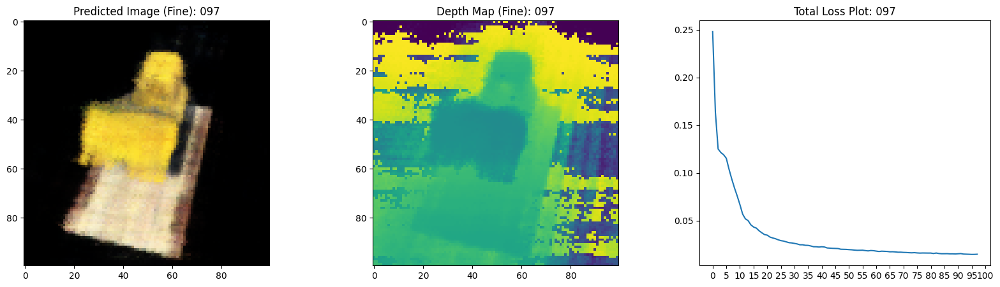

16/16 [==============================] - 8s 507ms/step - loss: 0.0149 - coarse_loss: 0.0075 - fine_loss: 0.0075 - coarse_psnr: 21.4046 - psnr: 21.4562 - val_loss: 0.0137 - val_coarse_loss: 0.0067 - val_fine_loss: 0.0069 - val_coarse_psnr: 21.8380 - val_psnr: 21.6971
Epoch 99/100
16/16 [==============================] - ETA: 0s - loss: 0.0149 - coarse_loss: 0.0073 - fine_loss: 0.0073 - coarse_psnr: 21.4929 - psnr: 21.4390

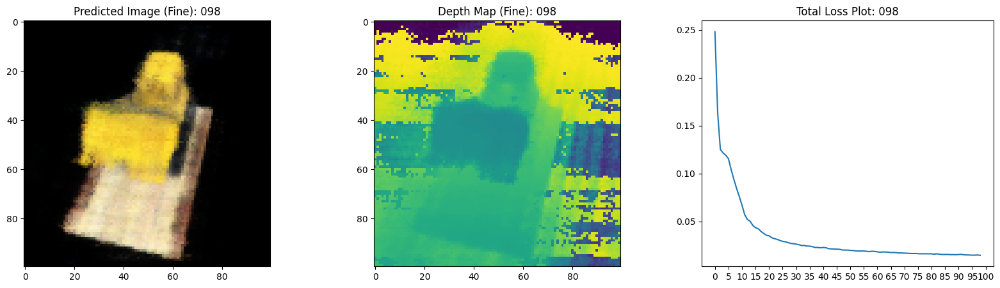

16/16 [==============================] - 8s 504ms/step - loss: 0.0148 - coarse_loss: 0.0073 - fine_loss: 0.0073 - coarse_psnr: 21.4929 - psnr: 21.4445 - val_loss: 0.0143 - val_coarse_loss: 0.0072 - val_fine_loss: 0.0072 - val_coarse_psnr: 21.5181 - val_psnr: 21.5290
Epoch 100/100
16/16 [==============================] - ETA: 0s - loss: 0.0149 - coarse_loss: 0.0075 - fine_loss: 0.0073 - coarse_psnr: 21.4378 - psnr: 21.4881

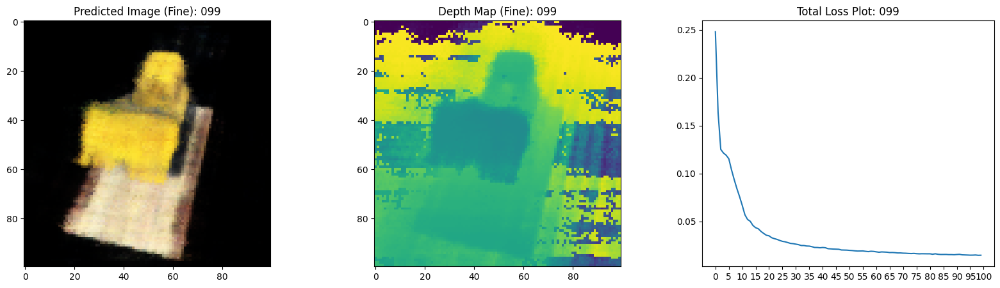

16/16 [==============================] - 8s 504ms/step - loss: 0.0149 - coarse_loss: 0.0075 - fine_loss: 0.0073 - coarse_psnr: 21.4378 - psnr: 21.4938 - val_loss: 0.0137 - val_coarse_loss: 0.0070 - val_fine_loss: 0.0068 - val_coarse_psnr: 21.6877 - val_psnr: 21.8111


100%|██████████| 100/100 [00:01<00:00, 86.26it/s]


In [32]:
class NeRF(keras.Model):
    def __init__(self, nerf_model_coarse, nerf_model_fine):
        super().__init__()
        self.nerf_model_coarse = nerf_model_coarse
        self.nerf_model_fine = nerf_model_fine

    def compile(self, optimizer_coarse, optimizer_fine, loss_fn):
        super().compile()
        self.optimizer_coarse = optimizer_coarse
        self.optimizer_fine = optimizer_fine
        self.loss_fn = loss_fn
        
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.coarse_loss_tracker = keras.metrics.Mean(name="coarse_loss")
        self.fine_loss_tracker = keras.metrics.Mean(name="fine_loss")
        self.coarse_psnr_metric = keras.metrics.Mean(name="coarse_psnr")
        self.fine_psnr_metric = keras.metrics.Mean(name="fine_psnr") # 대표 PSNR

    def train_step(self, inputs):
        (images, rays_od) = inputs # rays_od는 (ray_origins, ray_directions) 튜플
        ray_origins, ray_directions = rays_od

        with tf.GradientTape(persistent=True) as tape:
            rgb_fine, _, extras = render_rays_hierarchical( # 이전 셀에서 정의한 함수
                model_coarse=self.nerf_model_coarse,
                model_fine=self.nerf_model_fine,
                ray_origins=ray_origins,
                ray_directions=ray_directions,
                near=2.0, # 하드코딩된 값, 필요시 전역 변수 또는 인자로 변경
                far=6.0,  # 하드코딩된 값, 필요시 전역 변수 또는 인자로 변경
                perturb_coarse=True, # 학습 시에는 Coarse 샘플링도 stratified
                train=True
            )
            rgb_coarse = extras["rgb_coarse"]

            loss_coarse = self.loss_fn(images, rgb_coarse)
            loss_fine = self.loss_fn(images, rgb_fine)
            total_loss = loss_coarse + loss_fine

        # Coarse 모델 그래디언트 및 최적화
        trainable_vars_coarse = self.nerf_model_coarse.trainable_variables
        gradients_coarse = tape.gradient(total_loss, trainable_vars_coarse)
        self.optimizer_coarse.apply_gradients(zip(gradients_coarse, trainable_vars_coarse))

        # Fine 모델 그래디언트 및 최적화
        trainable_vars_fine = self.nerf_model_fine.trainable_variables
        gradients_fine = tape.gradient(total_loss, trainable_vars_fine)
        self.optimizer_fine.apply_gradients(zip(gradients_fine, trainable_vars_fine))
        
        del tape # persistent=True 사용 후 명시적 삭제

        psnr_coarse_val = tf.image.psnr(images, rgb_coarse, max_val=1.0)
        psnr_fine_val = tf.image.psnr(images, rgb_fine, max_val=1.0)

        self.total_loss_tracker.update_state(total_loss)
        self.coarse_loss_tracker.update_state(loss_coarse)
        self.fine_loss_tracker.update_state(loss_fine)
        self.coarse_psnr_metric.update_state(psnr_coarse_val)
        self.fine_psnr_metric.update_state(psnr_fine_val)
        
        return {
            "loss": self.total_loss_tracker.result(), # 대표 loss는 total로
            "coarse_loss": self.coarse_loss_tracker.result(),
            "fine_loss": self.fine_loss_tracker.result(),
            "coarse_psnr": self.coarse_psnr_metric.result(),
            "psnr": self.fine_psnr_metric.result(), # 대표 PSNR은 fine으로
        }

    def test_step(self, inputs):
        (images, rays_od) = inputs
        ray_origins, ray_directions = rays_od

        rgb_fine, _, extras = render_rays_hierarchical(
            model_coarse=self.nerf_model_coarse,
            model_fine=self.nerf_model_fine,
            ray_origins=ray_origins,
            ray_directions=ray_directions,
            near=2.0,
            far=6.0,
            perturb_coarse=False, # 평가 시에는 Coarse 샘플링도 deterministic
            train=False
        )
        rgb_coarse = extras["rgb_coarse"]
        
        loss_coarse = self.loss_fn(images, rgb_coarse)
        loss_fine = self.loss_fn(images, rgb_fine)
        total_loss = loss_coarse + loss_fine

        psnr_coarse_val = tf.image.psnr(images, rgb_coarse, max_val=1.0)
        psnr_fine_val = tf.image.psnr(images, rgb_fine, max_val=1.0)

        self.total_loss_tracker.update_state(total_loss)
        self.coarse_loss_tracker.update_state(loss_coarse)
        self.fine_loss_tracker.update_state(loss_fine)
        self.coarse_psnr_metric.update_state(psnr_coarse_val)
        self.fine_psnr_metric.update_state(psnr_fine_val)

        return {
            "loss": self.total_loss_tracker.result(),
            "coarse_loss": self.coarse_loss_tracker.result(),
            "fine_loss": self.fine_loss_tracker.result(),
            "coarse_psnr": self.coarse_psnr_metric.result(),
            "psnr": self.fine_psnr_metric.result(),
        }

    @property
    def metrics(self):
        return [
            self.total_loss_tracker, 
            self.coarse_loss_tracker, 
            self.fine_loss_tracker, 
            self.coarse_psnr_metric, 
            self.fine_psnr_metric
        ]

# TrainMonitor에서 사용할 고정된 테스트 광선 데이터 준비
# train_ds 또는 val_ds에서 한 배치를 가져옵니다.
# 이 코드는 model.fit() 호출 전에 실행되어야 합니다.
monitor_data_iter = iter(val_ds) # 검증 데이터셋 사용 권장, 없으면 train_ds
monitor_images_batch, (monitor_ray_origins_batch, monitor_ray_directions_batch) = next(monitor_data_iter)
del monitor_data_iter

loss_list = [] # TrainMonitor에서 사용

class TrainMonitor(keras.callbacks.Callback):
    def __init__(self, images_batch, ray_origins_batch, ray_directions_batch, near=2.0, far=6.0):
        super().__init__()
        self.images_batch = images_batch
        self.ray_origins_batch = ray_origins_batch
        self.ray_directions_batch = ray_directions_batch
        self.near = near
        self.far = far


    def on_epoch_end(self, epoch, logs=None):
        # logs에는 total_loss, coarse_loss, fine_loss, coarse_psnr, fine_psnr 등이 포함됨
        current_loss = logs.get("loss", None) # NeRF 모델의 'loss' metric (total_loss)
        if current_loss is not None:
            loss_list.append(current_loss)
        
        # 저장된 배치 데이터를 사용하여 이미지 생성
        recons_images_fine, depth_maps_fine, extras = render_rays_hierarchical(
            model_coarse=self.model.nerf_model_coarse, # 콜백 내에서는 self.model로 접근
            model_fine=self.model.nerf_model_fine,
            ray_origins=self.ray_origins_batch,
            ray_directions=self.ray_directions_batch,
            near=self.near, 
            far=self.far,
            perturb_coarse=False, # 시각화 시에는 deterministic
            train=False, # predict 모드
        )
        
        # Plot the rgb (fine), depth (fine) and the loss plot.
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
        ax[0].imshow(tf.keras.utils.array_to_img(recons_images_fine[0])) # 배치의 첫 번째 이미지
        ax[0].set_title(f"Predicted Image (Fine): {epoch:03d}")

        ax[1].imshow(tf.keras.utils.array_to_img(depth_maps_fine[0, ..., None]))
        ax[1].set_title(f"Depth Map (Fine): {epoch:03d}")

        if loss_list: # loss_list가 비어있지 않을 때만 plot
            ax[2].plot(loss_list)
            ax[2].set_xticks(np.arange(0, EPOCHS + 1, 5.0 if EPOCHS >=5 else 1.0))
            ax[2].set_title(f"Total Loss Plot: {epoch:03d}")

        fig.savefig(f"images/{epoch:03d}.png")
        plt.show() # 노트북에서 너무 많은 창이 뜨는 것을 방지하려면 주석 처리 권장
        plt.close(fig)


# 모델 생성
# SINGLE_COORD_ENCODED_DIMS는 이전 셀에서 정의된 전역 변수
nerf_model_coarse = get_nerf_model_modified(num_layers=8, encoded_dims_per_coord=SINGLE_COORD_ENCODED_DIMS)
nerf_model_fine = get_nerf_model_modified(num_layers=8, encoded_dims_per_coord=SINGLE_COORD_ENCODED_DIMS) # 동일 구조 사용

model = NeRF(nerf_model_coarse, nerf_model_fine)

# 옵티마이저 생성 (Coarse와 Fine에 대해 별도 또는 공유 가능)
# 여기서는 학습률이 동일한 별도의 옵티마이저 사용
optimizer_coarse = keras.optimizers.Adam(learning_rate=5e-4) # 원본 NeRF 학습률 참고
optimizer_fine = keras.optimizers.Adam(learning_rate=5e-4)

model.compile(
    optimizer_coarse=optimizer_coarse,
    optimizer_fine=optimizer_fine,
    loss_fn=keras.losses.MeanSquaredError()
)

# 이미지 저장 디렉토리 생성
if not os.path.exists("images"):
    os.makedirs("images")

# TrainMonitor 인스턴스 생성 시 준비된 데이터 전달
train_monitor_callback = TrainMonitor(
    images_batch=monitor_images_batch,
    ray_origins_batch=monitor_ray_origins_batch,
    ray_directions_batch=monitor_ray_directions_batch
)

# 모델 학습
history = model.fit(
    train_ds,
    validation_data=val_ds,
    # batch_size=BATCH_SIZE, # train_ds.batch(BATCH_SIZE)에서 이미 설정됨
    epochs=EPOCHS,
    callbacks=[train_monitor_callback], # 수정된 콜백 사용
)

# GIF 생성 함수 (변경 없음)
def create_gif(path_to_images, name_gif):
    filenames = glob.glob(path_to_images)
    filenames = sorted(filenames)
    if not filenames:
        print(f"No images found at {path_to_images} to create a GIF.")
        return
    images_for_gif = []
    for filename in tqdm(filenames):
        images_for_gif.append(imageio.imread(filename))
    kargs = {"duration": 0.25, "loop": 0} # loop=0 for infinite loop
    imageio.mimsave(name_gif, images_for_gif, "GIF", **kargs)

create_gif("images/*.png", "training_hierarchical.gif") # GIF 이름 변경

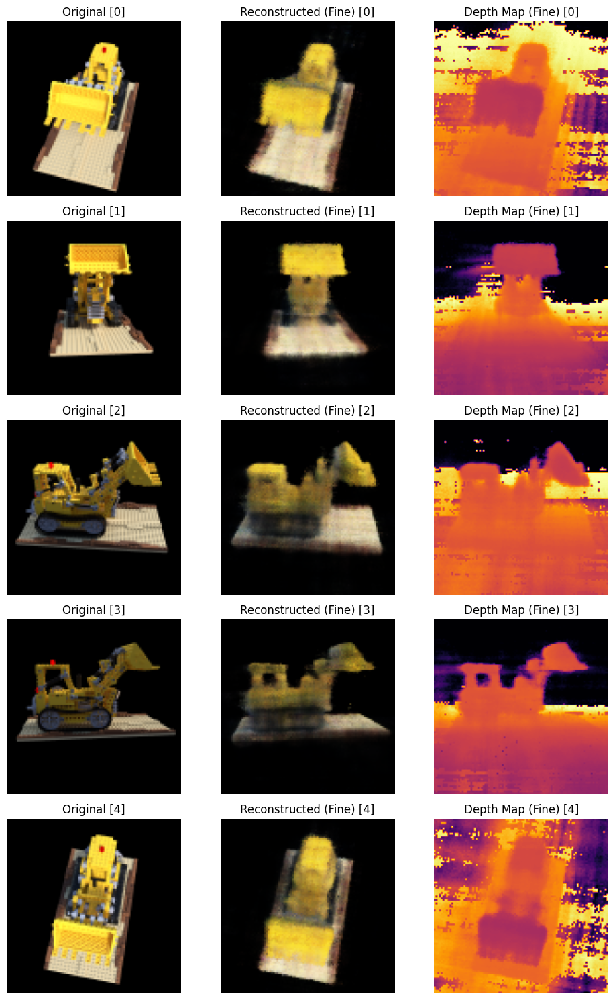

In [33]:
recons_images_fine, depth_maps_fine, extras = render_rays_hierarchical(
    model_coarse=model.nerf_model_coarse,
    model_fine=model.nerf_model_fine,
    ray_origins=monitor_ray_origins_batch,
    ray_directions=monitor_ray_directions_batch,
    near=2.0,
    far=6.0,
    perturb_coarse=False,
    train=False,
)

num_rows_to_plot = monitor_images_batch.shape[0]

fig, axes = plt.subplots(nrows=num_rows_to_plot, ncols=3, figsize=(10, 3 * num_rows_to_plot))

if num_rows_to_plot == 1:
    axes = np.array([axes])

for i in range(num_rows_to_plot):
    ax_row = axes[i]

    ori_img_np = monitor_images_batch[i].numpy()
    ax_row[0].imshow(np.clip(ori_img_np, 0.0, 1.0))
    ax_row[0].set_title(f"Original [{i}]")
    ax_row[0].axis('off')

    recons_img_fine_np = recons_images_fine[i].numpy()
    ax_row[1].imshow(np.clip(recons_img_fine_np, 0.0, 1.0))
    ax_row[1].set_title(f"Reconstructed (Fine) [{i}]")
    ax_row[1].axis('off')

    depth_map_fine_np = depth_maps_fine[i].numpy()
    ax_row[2].imshow(depth_map_fine_np, cmap="inferno")
    ax_row[2].set_title(f"Depth Map (Fine) [{i}]")
    ax_row[2].axis('off')

plt.tight_layout()
plt.show()

In [ ]:

def get_translation_t(t):
    """Get the translation matrix for movement in t."""
    matrix = [
        [1, 0, 0, 0],
        [0, 1, 0, 0],
        [0, 0, 1, t],
        [0, 0, 0, 1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)
 

def get_rotation_phi(phi):
    """Get the rotation matrix for movement in phi."""
    matrix = [
        [1, 0, 0, 0],
        [0, tf.cos(phi), -tf.sin(phi), 0],
        [0, tf.sin(phi), tf.cos(phi), 0],
        [0, 0, 0, 1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)


def get_rotation_theta(theta):
    """Get the rotation matrix for movement in theta."""
    matrix = [
        [tf.cos(theta), 0, -tf.sin(theta), 0],
        [0, 1, 0, 0],
        [tf.sin(theta), 0, tf.cos(theta), 0],
        [0, 0, 0, 1],
    ]
    return tf.convert_to_tensor(matrix, dtype=tf.float32)


def pose_spherical(theta, phi, t):
    """
    Get the camera to world matrix for the corresponding theta, phi
    and t.
    """
    c2w = get_translation_t(t)
    c2w = get_rotation_phi(phi / 180.0 * np.pi) @ c2w
    c2w = get_rotation_theta(theta / 180.0 * np.pi) @ c2w
    c2w = np.array([[-1, 0, 0, 0], [0, 0, 1, 0], [0, 1, 0, 0], [0, 0, 0, 1]]) @ c2w
    return c2w


rgb_frames = []
batch_flat = []
batch_t = []

# Iterate over different theta value and generate scenes.
for index, theta in tqdm(enumerate(np.linspace(0.0, 360.0, 120, endpoint=False))):
    # Get the camera to world matrix.
    c2w = pose_spherical(theta, -30.0, 4.0)

    #
    ray_oris, ray_dirs = get_rays(H, W, focal, c2w)
    rays_flat, t_vals = render_flat_rays(
        ray_oris, ray_dirs, near=2.0, far=6.0, num_samples=NUM_SAMPLES, rand=False
    )

    if index % BATCH_SIZE == 0 and index > 0:
        batched_flat = tf.stack(batch_flat, axis=0)
        batch_flat = [rays_flat]

        batched_t = tf.stack(batch_t, axis=0)
        batch_t = [t_vals]

        rgb, _ = render_rgb_depth(
            nerf_model, batched_flat, batched_t, rand=False, train=False
        )

        temp_rgb = [np.clip(255 * img, 0.0, 255.0).astype(np.uint8) for img in rgb]

        rgb_frames = rgb_frames + temp_rgb
    else:
        batch_flat.append(rays_flat)
        batch_t.append(t_vals)

rgb_video = "rgb_video.mp4"
imageio.mimwrite(rgb_video, rgb_frames, fps=30, quality=7, macro_block_size=None)